# DATA 690 Deep Learning Project
<h2>Yelp Restaurant Review Classification and Generation</h2>

<p><b>Group members: Jin Hui Xu, Soheila Rahmani</b></p>
<br>

Data source: https://www.yelp.com/dataset

<p>The dataset for this project is downloaded from the Yelp offcial website, and it is a subset of real world businesses, reviews, and user data.</p>
<p>The original dataset contains 6 seperate JSON files: </p>

  *   business.json
  *   review.json
  *   user.json
  *   checkin.json
  *   tip.json
  *   photo.json 

<p>Since our project is about NLP, we only use review.json for our purpose. Besides, the review file is 6.45 GB, so we have to randomly a smaller sample size due to the limited computing resource. </p>

<p>The details and process of data sampling and subset creation are stored in a separate notebook (DATA 690 Project - Data Transform.ipynb) in the project directory. The reason for doing that separately is that we have trouble opening such a huge file in CoLab for sampling, so we have to do this part on the local machine for creating the subset files. The sample size is 200k records, so each star label review has 40k records.</p>

<br>
<br>
<p>The project notebook consists of 4 different sections:</p>


*   Exploratory Data Analysis
*   Text Classification Models
*   Text Generative Models
*   HuggingFace Fine Tune Language Models (Classification and Generation)

<p>Each section can be run individually, they are originally created in different notebooks, and we put them all together in this final notebook for a smoother presentation. The source notebooks can be found in the project's notebooks directory.</p>










##Exploratory Data Analysis

In [ ]:
import pandas as pd
import numpy as np
import nltk
from nltk.corpus import stopwords
from nltk.stem import *
from nltk.stem.porter import *
import re
import matplotlib.pyplot as plt
from mlxtend.plotting import scatterplotmatrix
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
import torch
import torchvision
import torch.nn as nn

from sklearn.model_selection import train_test_split
from collections import Counter
#from transformers import AutoTokenizer
import torch
from torch.utils.data import Dataset, DataLoader
#from transformers import AutoModelForSequenceClassification, TrainingArguments, Trainer

import nltk
from nltk.corpus import stopwords
from nltk.stem import *
from nltk.stem.porter import *
import re
import matplotlib.pyplot as plt
from mlxtend.plotting import scatterplotmatrix
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [ ]:
review_url = "/content/drive/Shareddrives/DATA 690 Project/dataset/Transformed/yelp_restaurant_review.csv"
review_df = pd.read_csv(review_url)

The dataset includes 4 columns, business_id, stars, text and date. Text columns shows the list of customers' reviews. stars column in the data is used to derive sentiment.

In [ ]:
# Displaying Dataset 
review_df

,business_id,stars,text,date
0,Uo8uHd8yTz4GWHV3-waTDg,1,I'd like to start off by saying that I recogni...,2011-09-06 22:06:43
1,NEyVq3SIgEQrHiGYzh2O8A,1,Really?? Reservations made well ahead of time...,2019-01-27 00:24:16
2,dfhFtNJsprhyQinzjExyiw,1,We got an 11 dollar muffin that was called the...,2018-08-12 05:03:44
3,lzx8RTn6lQGkX8zM66vE0g,1,The service was good but I can do much better ...,2011-11-21 04:29:21
4,GxSmuTCzGuHwu9ozwB8_0w,1,Usually I would give this a good rating as we ...,2020-10-20 19:41:05
...,...,...,...,...
199995,GSg5v3ZJxmMPrlAXqat8tA,5,My husband and I love French food; it tastes s...,2018-06-26 18:35:35
199996,NBICv9HiNqtRJOgR5-2OeQ,5,Wow! We were treated! We found the Blue Door b...,2018-10-12 16:03:16
199997,KL2aHsx0yf_8_IT1DfVMrA,5,The food is absolutely outstanding. I hope Jus...,2020-07-22 04:34:48
199998,XnQYoHy23BULUooiqHe42Q,5,Such a great experience. Came to Lulu Green wi...,2020-02-08 02:12:41


### Preprocess text data

To make a prediction or classification not all the information is neccessery, so we can reduce the input dimension by decreasing the number of words, using some techniques, which include tokenization, removing stop words, stemming/lemmatization, etc. 

In [ ]:
nltk.download('stopwords')
nltk.download('wordnet')
stop = stopwords.words('english')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
# tokenization without stemming
def tokenizer(text):
    text = re.sub('<[^>]*>', '', text)
    emoticons = re.findall('(?::|;|=)(?:-)?(?:\)|\(|D|P)', text.lower())
    text = re.sub('[\W]+', ' ', text.lower()) +\
        ' '.join(emoticons).replace('-', '')
    tokenized = [w for w in text.split() if w not in stop]
    return tokenized

# tokenization with stemming
def tokenizer_porter(text):
    return [w for w in text.split() if w not in stop]

def stemming(text):
    stemmer = SnowballStemmer('english')
    text = re.sub('<[^>]*>', '', text)
    emoticons = re.findall('(?::|;|=)(?:-)?(?:\)|\(|D|P)', text.lower())
    text = re.sub('[\W]+', ' ', text.lower()) +\
        ' '.join(emoticons).replace('-', '')              
    return ' '.join(stemmer.stem(w) for w in text.split() if w not in stop)

def lemmatizing(text):
    lemmatizer = WordNetLemmatizer()
    
    text = re.sub('<[^>]*>', '', text)
    emoticons = re.findall('(?::|;|=)(?:-)?(?:\)|\(|D|P)', text.lower())
    text = re.sub('[\W]+', ' ', text.lower()) +\
        ' '.join(emoticons).replace('-', '')              
    return ' '.join(lemmatizer.lemmatize(w) for w in text.split() if w not in stop)    

In [ ]:
tokenized_review_df = review_df

In [ ]:
tokenized_review_df['text_lemma'] = tokenized_review_df['text'].apply(lemmatizing)
tokenized_review_df['text_stem'] = tokenized_review_df['text'].apply(stemming)
tokenized_review_df['text_lemma_token'] = tokenized_review_df['text_lemma'].apply(tokenizer_porter)
tokenized_review_df['text_stem_token'] = tokenized_review_df['text_stem'].apply(tokenizer_porter)

In [ ]:
tokenized_review_df

,business_id,stars,text,date,sentiment,text_lemma,text_stem,text_lemma_token,text_stem_token
0,Uo8uHd8yTz4GWHV3-waTDg,1,I'd like to start off by saying that I recogni...,2011-09-06 22:06:43,-1,like start saying recognize 2011 hard growing ...,like start say recogn 2011 hard grow year vege...,"[like, start, saying, recognize, 2011, hard, g...","[like, start, say, recogn, 2011, hard, grow, y..."
1,NEyVq3SIgEQrHiGYzh2O8A,1,Really?? Reservations made well ahead of time...,2019-01-27 00:24:16,-1,really reservation made well ahead time run 20...,realli reserv made well ahead time run 20 plus...,"[really, reservation, made, well, ahead, time,...","[realli, reserv, made, well, ahead, time, run,..."
2,dfhFtNJsprhyQinzjExyiw,1,We got an 11 dollar muffin that was called the...,2018-08-12 05:03:44,-1,got 11 dollar muffin called gato cake good sit...,got 11 dollar muffin call gato cake good sit w...,"[got, 11, dollar, muffin, called, gato, cake, ...","[got, 11, dollar, muffin, call, gato, cake, go..."
3,lzx8RTn6lQGkX8zM66vE0g,1,The service was good but I can do much better ...,2011-11-21 04:29:21,-1,service good much better 8 sunday afternoon ba...,servic good much better 8 sunday afternoon bak...,"[service, good, much, better, 8, sunday, after...","[servic, good, much, better, 8, sunday, aftern..."
4,GxSmuTCzGuHwu9ozwB8_0w,1,Usually I would give this a good rating as we ...,2020-10-20 19:41:05,-1,usually would give good rating constantly dine...,usual would give good rate constant dine chuy ...,"[usually, would, give, good, rating, constantl...","[usual, would, give, good, rate, constant, din..."
...,...,...,...,...,...,...,...,...,...
199995,GSg5v3ZJxmMPrlAXqat8tA,5,My husband and I love French food; it tastes s...,2018-06-26 18:35:35,1,husband love french food taste homey comfortin...,husband love french food tast homey comfort mm...,"[husband, love, french, food, taste, homey, co...","[husband, love, french, food, tast, homey, com..."
199996,NBICv9HiNqtRJOgR5-2OeQ,5,Wow! We were treated! We found the Blue Door b...,2018-10-12 16:03:16,1,wow treated found blue door accident first won...,wow treat found blue door accid first wonder w...,"[wow, treated, found, blue, door, accident, fi...","[wow, treat, found, blue, door, accid, first, ..."
199997,KL2aHsx0yf_8_IT1DfVMrA,5,The food is absolutely outstanding. I hope Jus...,2020-07-22 04:34:48,1,food absolutely outstanding hope justin staff ...,food absolut outstand hope justin staff surviv...,"[food, absolutely, outstanding, hope, justin, ...","[food, absolut, outstand, hope, justin, staff,..."
199998,XnQYoHy23BULUooiqHe42Q,5,Such a great experience. Came to Lulu Green wi...,2020-02-08 02:12:41,1,great experience came lulu green friend dinner...,great experi came lulu green friend dinner ton...,"[great, experience, came, lulu, green, friend,...","[great, experi, came, lulu, green, friend, din..."


### Visualization  

This step would be to visualize the words so that you can see how the stack up in terms of frequency.

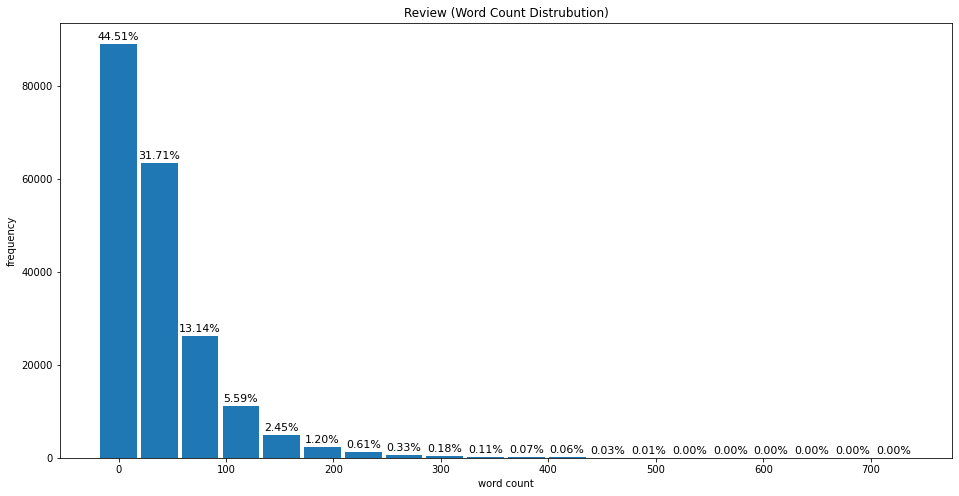

In [ ]:
plt.subplots(figsize = (16, 8))
word_count = tokenized_review_df['text_lemma_token'].str.len()
n, bins, patches = plt.hist(word_count, align = 'left', rwidth = 0.9, bins = 20)

for p in patches:
  plt.annotate("%2.2f%%" % ((p.get_height() / word_count.shape[0]) * 100), (p.get_x() + p.get_width() / 2., p.get_height()),
      ha = 'center', va = 'center', fontsize = 11, xytext = (0, 7),
      textcoords = 'offset points')
  
plt.title('Review (Word Count Distrubution)')
plt.xlabel('word count')
plt.ylabel('frequency')
plt.show()

Most of the reviews contain less than 200 words.

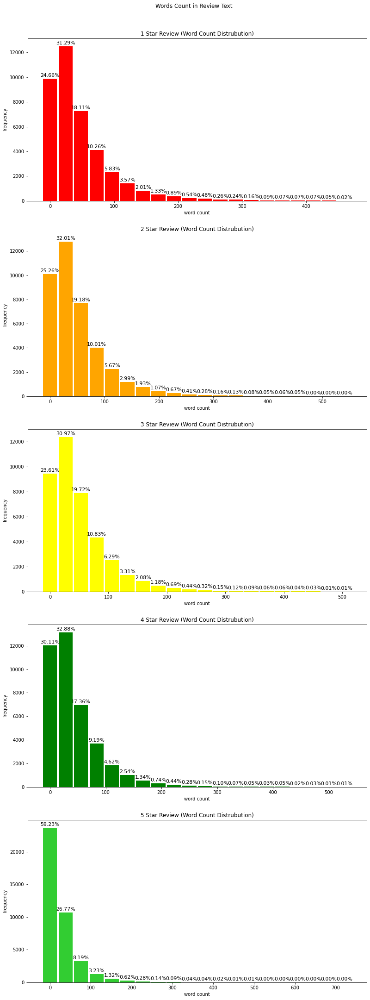

In [ ]:
rows_n = 5
fig, axes = plt.subplots(nrows = rows_n, figsize = (12, 30))
plt.tight_layout(pad = 5)

color_dict = {0: 'red', 1: 'orange', 2: 'yellow', 3: 'green', 4: 'limegreen'}

for i in range(rows_n):
  word_count = tokenized_review_df[tokenized_review_df["stars"] == i + 1]['text_lemma_token'].str.len()
  axes[i].hist(word_count, align = 'left', rwidth = 0.9, bins = 20, color = color_dict[i])
  for p in axes[i].patches:
    axes[i].annotate("%2.2f%%" % ((p.get_height() / word_count.shape[0]) * 100), (p.get_x() + p.get_width() / 2., p.get_height()),
        ha = 'center', va = 'center', fontsize = 11, xytext = (0, 7),
        textcoords = 'offset points')

for i in range(rows_n):
  axes[i].set_title('{} Star Review (Word Count Distrubution)'.format(i + 1))
  axes[i].set_ylabel('frequency')
  axes[i].set_xlabel('word count')

fig.suptitle('Words Count in Review Text', y = 1.01)
plt.show()

The word counts distributions for each star are similar except 5-star review. It is very surprising because 5-star reviews are pretty short compared to others.

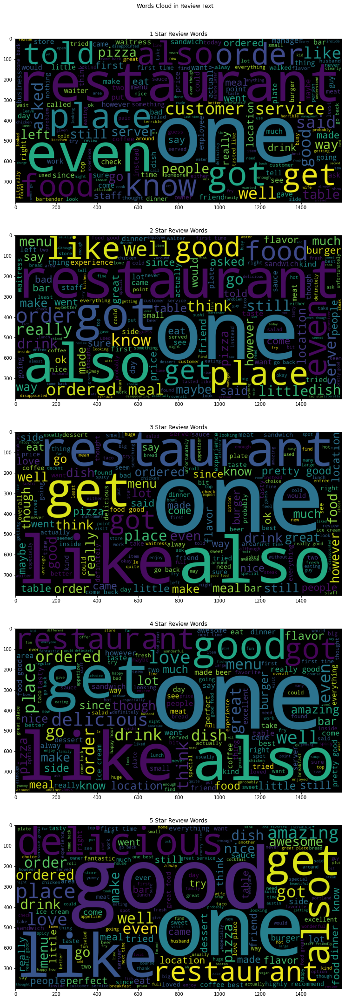

In [ ]:
rows_n = 5
fig, axes = plt.subplots(nrows = rows_n, figsize = (12, 30))
plt.tight_layout(pad = 5)


for i in range(rows_n):
  wordcloud = WordCloud(width = 1600, height = 800, random_state = 1, stopwords = stop, background_color = 'black')
  wordcloud.generate(str(set(tokenized_review_df[tokenized_review_df['stars'] == i + 1]['text_lemma'])))
  axes[i].imshow(wordcloud)

for i in range(rows_n):
  axes[i].set_title('{} Star Review Words'.format(i + 1))

fig.suptitle('Words Cloud in Review Text', y = 1.01)
plt.show()


Word cloud lets us visualize what the distribution of the text looks like. If the frequency of the word in all the reviews is high, the word appears large and if it's low the word appears small.As a distribution of the text, the above word clouds show that in the five star reviews the positive words has larger size than the other distributions. 

##Text Classification Models

References:

https://github.com/EdwardRaff/Inside-Deep-Learning<br>
https://medium.com/swlh/sentiment-classification-using-word-embeddings-word2vec-aedf28fbb8ca
https://towardsdatascience.com/sentiment-classification-using-cnn-in-pytorch-fba3c6840430

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from collections import Counter
import torch
from torch.utils.data import Dataset, DataLoader
import nltk
from nltk.corpus import stopwords
from nltk.stem import *
from nltk.stem.porter import *
import re
import matplotlib.pyplot as plt
from mlxtend.plotting import scatterplotmatrix
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
from pathlib import Path
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
from google_drive_downloader import GoogleDriveDownloader as gdd
from torch.utils.data import DataLoader, Dataset
from sklearn.feature_extraction.text import CountVectorizer
from tqdm import tqdm, tqdm_notebook

In [ ]:
!git clone https://github.com/EdwardRaff/Inside-Deep-Learning.git
%run /content/Inside-Deep-Learning/idlmam.py

fatal: destination path 'Inside-Deep-Learning' already exists and is not an empty directory.


### Convolutional Neural Network

In [ ]:
DATA_PATH = "/content/drive/Shareddrives/DATA 690 Project/dataset/Transformed/yelp_restaurant_review.csv"

In this model we applied different approch than our textbook. 

We showed how CNN can be used for text classification problems and how to design the network to accept word2vec pre-trained embeddings as input to the network. We also tried to have an experiance mapping the stars values to sentiment values (-1, 0, 1) as a three classes labeling.

We start with mapping from stars to sentiment and creating new column for sentiment indication and plotting the distribution for each sentiment. We defined three outputs (sentiment Classes), positive (1), negative (-1) and neutral (0).

Number of rows per star rating:
5    40000
4    40000
3    40000
2    40000
1    40000
Name: stars, dtype: int64 




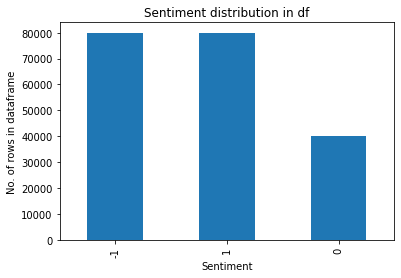

In [ ]:
import matplotlib.pyplot as plt 

print("Number of rows per star rating:")
print(review_df['stars'].value_counts(), "\n\n")

# Function to map stars to sentiment
def map_sentiment(stars_received):
    if stars_received <= 2.0:
        return -1 # negative sentiment
    elif stars_received <= 3.0 and stars_received > 2.0:
        return 0 # neutral sentiment
    else:
        return 1 # positive sentiment

# Mapping stars to sentiment into three categories
review_df['sentiment'] = [ map_sentiment(x) for x in review_df['stars']]
review_df['sentiment'] = [ map_sentiment(x) for x in review_df['stars']]

# Plotting the sentiment distribution
plt.figure()
pd.value_counts(review_df['sentiment']).plot.bar(title="Sentiment distribution in df")
plt.xlabel("Sentiment")
plt.ylabel("No. of rows in dataframe")
plt.show()

As the above graph shows, the dataset includs the same number of positive and negative reviews. The number of rows that are distributed in positive and negative reviews are the same and for neutral is less than the others.

In [ ]:
nltk.download('stopwords')
nltk.download('wordnet')
stop = stopwords.words('english')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
Gen_FOLDER = '/content/drive/Shareddrives/DATA 690 Project/NewFolder/'

Splitting data into two parts, train and test with 70% in train and 30% in test.

In [ ]:
from sklearn.model_selection import train_test_split

# Split dataset to the Train and Test data
def split_train_test(top_data_df_small, test_size=0.3, shuffle_state=True): 
    #create train and test data
    x = tokenized_review_df #assign Lemmatizeddata column to variable x 
    y = tokenized_review_df.sentiment #assign sentiment column to variable y

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)
  
    print("Number of sentiments for Training data")
    print(y_train.value_counts())
    print("Number of sentiments for Testing data")
    print(y_test.value_counts())

    x_train = x_train.reset_index()
    x_test = x_test.reset_index()
    y_train = y_train.to_frame()
    y_train = y_train.reset_index()
    y_test = y_test.to_frame()
    y_test = y_test.reset_index()

    print(x_train.head())
    return x_train, x_test, y_train, y_test

# Split dataset to Train and Test
x_train, x_test, y_train, y_test = split_train_test(tokenized_review_df)

Number of sentiments for Training data
-1    56175
 1    55805
 0    28020
Name: sentiment, dtype: int64
Number of sentiments for Testing data
 1    24195
-1    23825
 0    11980
Name: sentiment, dtype: int64
    index  ...                                    text_stem_token
0   21269  ...  [eat, none, food, line, within, accept, temp, ...
1  187660  ...  [favorit, place, coffe, central, squar, scone,...
2     774  ...  [take, look, ceil, walk, place, premier, bbq, ...
3  184577  ...  [delici, burger, delici, bowl, full, perfect, ...
4   37127  ...  [experi, adam, c, walk, look, around, grimac, ...

[5 rows x 10 columns]


In this section we generate the input and output tensor with the Word2Vec input vectors and trained with embedding size of 500. To keep the length of sentences the same, we added padding token to fill extra remaining words.

Now we start training the Word2Vec model using below function.

In [ ]:
from gensim.models import Word2Vec
size = 500  #Word2Vec vectors of size 500 as input
window = 3
min_count = 1
workers = 3
sg = 1

# Create word2vec model
def make_word2vec_model(tokenized_review_df, padding=True, sg=1, min_count=1, size=500, workers=3, window=3):
    if  padding:
        print(len(tokenized_review_df))

        tokenR_df = pd.Series(tokenized_review_df['text_lemma_token']).values
        tokenR_df = list(tokenR_df)
        tokenR_df.append(['pad'])
        word2vec_file = Gen_FOLDER   + 'models/'+ 'word2vec_' + str(size) + '_PAD.model'
    else:
        tokenR_df = tokenized_review_df['text_lemma_token']
        word2vec_file = Gen_FOLDER   + 'models/'+ 'word2vec_' + str(size) + '.model'
        
    w2v_model = Word2Vec(tokenR_df, min_count = min_count, size = size, workers = workers, window = window, sg = sg)

    w2v_model.save(word2vec_file)
    return w2v_model, word2vec_file

# Train Word2vec model
w2vmodel, word2vec_file = make_word2vec_model(tokenized_review_df, padding=True, sg=sg, min_count=min_count, size=size, workers=workers, window=window)


200000


Now, we define a function to generate input tensor after the model was ready.

In [ ]:
max_sen_len = tokenized_review_df.text_lemma_token.map(len).max()
padding_idx = w2vmodel.wv.vocab['pad'].index

def make_word2vec_vector_cnn(sentence):
    padded_X = [padding_idx for i in range(max_sen_len)]
    i = 0
    for word in sentence:
        if word not in w2vmodel.wv.vocab:
            padded_X[i] = 0
            print(word)
        else:
            padded_X[i] = w2vmodel.wv.vocab[word].index
        i += 1
    return torch.tensor(padded_X, dtype=torch.long, device=device).view(1, -1)

To create the output tensor, mapping from label to positive values has to be done. Since we had -1 for negative, which is not possible in neural network, we need to map it to a positive number. Three neurons in the output layer will give probabilities for each label and we mapped them to the positive numbers.

In [ ]:
# Getting the output tensor
def make_target(label):
    if label == -1:
        return torch.tensor([0], dtype=torch.long, device=device)
    elif label == 0:
        return torch.tensor([1], dtype=torch.long, device=device)
    else:
        return torch.tensor([2], dtype=torch.long, device=device)

Now we define the CNN model. In below function we loaded the model that have been already generated. We can have this approch when we are training word2vec at different time and run CNN at different times (gaining some experience how to use this approch).

In [ ]:
EMBEDDING_SIZE = 500
NUM_FILTERS = 10
import gensim

class CnnTextClassifier(nn.Module):
    def __init__(self, vocab_size, num_classes, window_sizes=(1,2,3,5)):
        super(CnnTextClassifier, self).__init__()
        w2vmodel = gensim.models.KeyedVectors.load(Gen_FOLDER + 'models/' + 'word2vec_500_PAD.model')
        weights = w2vmodel.wv

        # With pretrained embeddings
        self.embedding = nn.Embedding.from_pretrained(torch.FloatTensor(weights.vectors), padding_idx=w2vmodel.wv.vocab['pad'].index)

        # Without pretrained embeddings
        self.convs = nn.ModuleList([nn.Conv2d(1, NUM_FILTERS, [window_size, EMBEDDING_SIZE], padding=(window_size - 1, 0)) for window_size in window_sizes])
        self.fc = nn.Linear(NUM_FILTERS * len(window_sizes), num_classes)

    def forward(self, x):
        x = self.embedding(x) # [B, T, E]

        # Apply a convolution + max_pool layer for each window size
        x = torch.unsqueeze(x, 1)
        xs = []
        for conv in self.convs:
            x2 = torch.tanh(conv(x))
            x2 = torch.squeeze(x2, -1)
            x2 = F.max_pool1d(x2, x2.size(2))
            xs.append(x2)
        x = torch.cat(xs, 2)

        # FC
        x = x.view(x.size(0), -1)
        logits = self.fc(x)
        probs = F.softmax(logits, dim = 1)
        return probs

After the network is defined, we initialize the necessary objects for training, such as model object, loss and optimization object. 

Below code displays how to train the CNN model. We ran this model for 10 epochs and recorded the loss at each step for training data.

In [ ]:
NUM_CLASSES = 3
VOCAB_SIZE = len(w2vmodel.wv.vocab)

cnn_model = CnnTextClassifier(vocab_size=VOCAB_SIZE, num_classes=NUM_CLASSES)
cnn_model.to(device)
loss_function = nn.CrossEntropyLoss()
optimizer = optim.Adam(cnn_model.parameters(), lr=0.001)
num_epochs = 10

# Open the file for writing loss
loss_file_name = Gen_FOLDER +  'plots/' + 'cnn_class_big_loss_with_padding.csv'
f = open(loss_file_name,'w')
f.write('iter, loss')
f.write('\n')
losses = []
cnn_model.train()
for epoch in range(num_epochs):
    #print("Epoch" + str(epoch + 1))
    train_loss = 0
    for index, row in x_train.iterrows():
        # Clearing the accumulated gradients
        cnn_model.zero_grad()

        # Make the bag of words vector for lemma tokens 
        bow_vec = make_word2vec_vector_cnn(row['text_lemma_token'])
       
        # Forward pass to get output
        probs = cnn_model(bow_vec)

        # Get the target label
        target = make_target(y_train['sentiment'][index])

        # Calculate Loss: softmax --> cross entropy loss
        loss = loss_function(probs, target)
        train_loss += loss.item()

        # Getting gradients w.r.t. parameters
        loss.backward()

        # Updating parameters
        optimizer.step()

    print("Epoch"+ str(epoch+1)+ " 100%")

    f.write(str((epoch+1)) + "," + str(train_loss / len(x_train)))
    f.write('\n')
    train_loss = 0

torch.save(cnn_model, Gen_FOLDER + 'cnn_big_model_500_with_padding.pth')

f.close()


Epoch1 100%
Epoch2 100%
Epoch3 100%
Epoch4 100%
Epoch5 100%
Epoch6 100%
Epoch7 100%
Epoch8 100%
Epoch9 100%
Epoch10 100%


Now we test the model and plotted the loss graph along with calculating the accuracy score. 

Index(['iter', ' loss'], dtype='object')
              precision    recall  f1-score   support

           0       0.79      0.87      0.83     23825
           1       0.51      0.38      0.44     11980
           2       0.82      0.85      0.83     24195

    accuracy                           0.76     60000
   macro avg       0.71      0.70      0.70     60000
weighted avg       0.75      0.76      0.75     60000

Index(['iter', ' loss'], dtype='object')


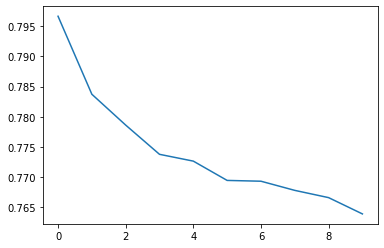

In [ ]:
from sklearn.metrics import classification_report

bow_cnn_predictions = []
original_lables_cnn_bow = []
cnn_model.eval()

loss_df = pd.read_csv(Gen_FOLDER +  'plots/' + 'cnn_class_big_loss_with_padding.csv')
print(loss_df.columns)

with torch.no_grad():
    for index, row in x_test.iterrows():
        bow_vec = make_word2vec_vector_cnn(row['text_lemma_token'])
        probs = cnn_model(bow_vec)
        _, predicted = torch.max(probs.data, 1)
        bow_cnn_predictions.append(predicted.cpu().numpy()[0])
        original_lables_cnn_bow.append(make_target(y_test['sentiment'][index]).cpu().numpy()[0])
print(classification_report(original_lables_cnn_bow,bow_cnn_predictions))

loss_file_name = Gen_FOLDER +  'plots/' + 'cnn_class_big_loss_with_padding.csv'
loss_df = pd.read_csv(loss_file_name)
print(loss_df.columns)
plt_500_padding_30_epochs = loss_df[' loss'].plot()
fig = plt_500_padding_30_epochs.get_figure()
fig.savefig(Gen_FOLDER +'plots/' + 'loss_plt_500_padding_30_epochs.pdf')

From the loss graph it is clear that the loss is decreasing continuously and the loss is not fluctuating a lot which indicates the learning rate is not too high. Accuracy of 0.76 is very good accuracy.

### Recurrent Neural Networks

In [ ]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
review_url = '/content/drive/Shareddrives/DATA 690 Project/dataset/Transformed/yelp_restaurant_review.csv'
review_df = pd.read_csv(review_url)

In [ ]:
def lowercase(text):
    return text.lower()

In [ ]:
review_df['text'] = review_df['text'].apply(lowercase)

In [ ]:
nltk.download('stopwords')
nltk.download('wordnet')
stop = stopwords.words('english')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


In [ ]:
# Word tokenization helper functions

# tokenization with stemming
def tokenizer_porter(text):
    return [w for w in text.split() if w not in stop]

def stemming(text):
    stemmer = SnowballStemmer('english')
    text = re.sub('<[^>]*>', '', text)
    emoticons = re.findall('(?::|;|=)(?:-)?(?:\)|\(|D|P)', text.lower())
    text = re.sub('[\W]+', ' ', text.lower()) +\
        ' '.join(emoticons).replace('-', '')              
    return ' '.join(stemmer.stem(w) for w in text.split() if w not in stop)

# tokenization with lemmatizing
def lemmatizing(text):
    lemmatizer = WordNetLemmatizer()
    
    text = re.sub('<[^>]*>', '', text)
    emoticons = re.findall('(?::|;|=)(?:-)?(?:\)|\(|D|P)', text.lower())
    text = re.sub('[\W]+', ' ', text.lower()) +\
        ' '.join(emoticons).replace('-', '')              
    return ' '.join(lemmatizer.lemmatize(w) for w in text.split() if w not in stop) 

In [ ]:
review_df['text_lemma'] = review_df['text'].apply(lemmatizing)

In [ ]:
review_df

,business_id,stars,text,date,text_lemma
0,Uo8uHd8yTz4GWHV3-waTDg,1,i'd like to start off by saying that i recogni...,2011-09-06 22:06:43,like start saying recognize 2011 hard growing ...
1,NEyVq3SIgEQrHiGYzh2O8A,1,really?? reservations made well ahead of time...,2019-01-27 00:24:16,really reservation made well ahead time run 20...
2,dfhFtNJsprhyQinzjExyiw,1,we got an 11 dollar muffin that was called the...,2018-08-12 05:03:44,got 11 dollar muffin called gato cake good sit...
3,lzx8RTn6lQGkX8zM66vE0g,1,the service was good but i can do much better ...,2011-11-21 04:29:21,service good much better 8 sunday afternoon ba...
4,GxSmuTCzGuHwu9ozwB8_0w,1,usually i would give this a good rating as we ...,2020-10-20 19:41:05,usually would give good rating constantly dine...
...,...,...,...,...,...
199995,GSg5v3ZJxmMPrlAXqat8tA,5,my husband and i love french food; it tastes s...,2018-06-26 18:35:35,husband love french food taste homey comfortin...
199996,NBICv9HiNqtRJOgR5-2OeQ,5,wow! we were treated! we found the blue door b...,2018-10-12 16:03:16,wow treated found blue door accident first won...
199997,KL2aHsx0yf_8_IT1DfVMrA,5,the food is absolutely outstanding. i hope jus...,2020-07-22 04:34:48,food absolutely outstanding hope justin staff ...
199998,XnQYoHy23BULUooiqHe42Q,5,such a great experience. came to lulu green wi...,2020-02-08 02:12:41,great experience came lulu green friend dinner...


In [ ]:
# get only label and our text_lemma values and put them into list
data = review_df.iloc[:, [1,4]].values.tolist()

Tokenizing the text, counting the number of lines in the dataset and creating a vocabulary list of the words from training dataset.

In [ ]:
from torchtext.data.utils import get_tokenizer  #tokenizers break strings like "this is a string" into lists of tokens like ['this', 'is', 'a', 'string']

tokenizer = get_tokenizer('basic_english') #we will be fine with the default english style tokenizer

from collections import Counter #how many lines in this dataset
from torchtext.vocab import Vocab #we need to create a vocabulary of all the words in the training set

counter = Counter() 
for review in data: #loop through the training data 
    counter.update(tokenizer(review[1])) #count the number of unique tokens we see and how often we see them (e.g., we will see "the" a lot, but "sasquatch" maybe once or not at all.)

pad = "<PAD>"
counter.update(tokenizer(pad))
vocab = Vocab(counter)

To start training the model first we split data to the training and test sets, with the 20% test and 80% train data.

In [ ]:
# split the data set into training and testing data with 20% ratio
train_data, test_data = train_test_split(data, test_size=0.2, random_state=0)

Now we use the below function to get the numeric values of tokens from vocabulary list.

In [ ]:
def text_transform(x): #string -> list of integers
    return [vocab[token] for token in x]

# transfer label to start at 0
def label_transform(x): 
    return x-1

Once we are done transforming data to numeric, we can apply the function for a text example.

In [ ]:
# example tokenized text
print(text_transform(train_data[0][1])) 

[1007, 4, 431, 29, 24, 0, 2934, 4, 614, 424, 24, 0, 1675, 29, 431, 24, 623, 0, 2934, 48, 0, 1007, 431, 4, 1665, 2934, 48, 0, 1653, 29, 49571, 623, 48, 0, 48, 1665, 1653, 4, 48, 1665, 0, 48, 4, 2934, 2934, 1665, 431, 0, 424, 29, 2480, 1665, 954, 1665, 431, 0, 431, 1665, 0, 48, 0, 1, 1665, 623, 1675, 0, 431, 1665, 954, 4, 1665, 2480, 0, 431, 1665, 29, 24, 0, 49571, 431, 0, 2934, 24, 0, 48, 29, 2480, 2934, 29, 24, 0, 4, 431, 29, 0, 48, 1665, 1653, 4, 48, 1665, 48, 0, 614, 4, 954, 1665, 0, 24, 431, 1, 0, 614, 29, 0, 1675, 431, 1665, 24, 24, 1, 0, 243, 49571, 4, 1665, 24, 0, 0, 24, 24, 431, 4, 2296, 49571, 24, 1665, 48, 0, 142, 29, 2934, 48, 0, 1, 0, 2934, 4, 614, 424, 24, 0, 29, 0, 24, 0, 1675, 1665, 431, 49571, 29, 4, 2934, 614, 0, 142, 1665, 2934, 49571, 0, 29, 431, 48, 1665, 431, 1665, 48, 0, 22589, 0, 623, 4, 24, 24, 623, 1665, 0, 1675, 4, 614, 0, 440, 0, 1653, 492, 431, 0, 2296, 2296, 4, 24, 0, 2296, 49571, 431, 614, 1665, 431, 0, 1653, 0, 49571, 623, 4, 1007, 623, 29, 2480, 1665, 431

In [ ]:
VOCAB_SIZE = len(vocab)
NUM_CLASS = len(np.unique([z[0] for z in train_data])) 
print("Vocab: ", VOCAB_SIZE)
print("Num Classes: ", NUM_CLASS)

padding_idx = vocab["<PAD>"]

embed_dim = 128
B = 64
epochs = 10

Vocab:  90247
Num Classes:  5


To keep the length of sentences the same, we added padding token to fill extra remaining words. So, we padded items in the batch to the length of the longest item in the batch. Also, re-order so that the values are returned (input, label).

In [ ]:
def pad_batch(batch):
    """
    Pad items in the batch to the length of the longest item in the batch. 
    Also, re-order so that the values are returned (input, label)
    """
    labels = [label_transform(z[0]) for z in batch] #get and transform every label in the batch
    texts = [torch.tensor(text_transform(z[1]), dtype=torch.int64) for z in batch] #get, tokenizer, and put into a tensor every text

    #what is the longest sequence in this batch? 
    max_len = 400 #max([text.size(0) for text in texts])

    #pad each text tensor by whatever amount gets it to the max_len
    texts = [F.pad(text, (0,max_len-text.size(0)), value=padding_idx) for text in texts]

    #make x and y a single tensor
    x, y = torch.stack(texts), torch.tensor(labels, dtype=torch.int64)
    return x, y

In [ ]:
train_loader = DataLoader(train_data, batch_size=B, shuffle=True, collate_fn=pad_batch)
test_loader = DataLoader(test_data, batch_size=B, collate_fn=pad_batch)

The next step is to define our RNN module. We will use the nn.Sequential to build our model out of the Embedding to perform the embedding, followed by 
nn.LSTM to get the hidden states h_t and the context states c_t, followed by LastTimeStep to extract the final hidden states, and ending with a nn.Linear to perform a classification based on the input.



In [ ]:
LSTM = nn.Sequential(
  nn.Embedding(VOCAB_SIZE, embed_dim, padding_idx=padding_idx), #(B, T) -> (B, T, D)
  nn.LSTM(embed_dim, embed_dim, num_layers=3, batch_first=True, bidirectional=True), #(B, T, D) -> ( (B,T,D) , (S, B, D)  )
  LastTimeStep(rnn_layers=3, bidirectional=True), #We need to take the RNN output and reduce it to one item, (B, 2*D)
  nn.Linear(embed_dim*2, NUM_CLASS), #(B, D) -> (B, classes)
)

#We still want to use gradient clipping with every kind of RNN, including LSTMs
for p in LSTM.parameters():
    p.register_hook(lambda grad: torch.clamp(grad, -5, 5))

loss_func = nn.CrossEntropyLoss()

We defined our loss function as .CrossEntropyLoss() and trained our model. Below you can see how well this model performs.

In [ ]:
checkpoint_file='/content/drive/Shareddrives/DATA 690 Project/Checkpoints/LSTM_model_classification.pt'
LSTM_results = train_network(LSTM, loss_func, train_loader, val_loader=test_loader, score_funcs={'Accuracy': accuracy_score}, device=device, epochs=epochs, checkpoint_file=checkpoint_file)

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/2500 [00:00<?, ?it/s]

Validating:   0%|          | 0/625 [00:00<?, ?it/s]

Training:   0%|          | 0/2500 [00:00<?, ?it/s]

Validating:   0%|          | 0/625 [00:00<?, ?it/s]

Training:   0%|          | 0/2500 [00:00<?, ?it/s]

Validating:   0%|          | 0/625 [00:00<?, ?it/s]

Training:   0%|          | 0/2500 [00:00<?, ?it/s]

Validating:   0%|          | 0/625 [00:00<?, ?it/s]

Training:   0%|          | 0/2500 [00:00<?, ?it/s]

Validating:   0%|          | 0/625 [00:00<?, ?it/s]

Training:   0%|          | 0/2500 [00:00<?, ?it/s]

Validating:   0%|          | 0/625 [00:00<?, ?it/s]

Training:   0%|          | 0/2500 [00:00<?, ?it/s]

Validating:   0%|          | 0/625 [00:00<?, ?it/s]

Training:   0%|          | 0/2500 [00:00<?, ?it/s]

Validating:   0%|          | 0/625 [00:00<?, ?it/s]

Training:   0%|          | 0/2500 [00:00<?, ?it/s]

Validating:   0%|          | 0/625 [00:00<?, ?it/s]

Training:   0%|          | 0/2500 [00:00<?, ?it/s]

Validating:   0%|          | 0/625 [00:00<?, ?it/s]

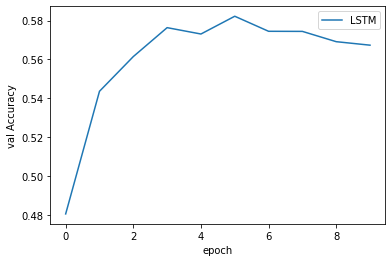

In [ ]:
sns.lineplot(x='epoch', y='val Accuracy', data=LSTM_results, label='LSTM')

The result is shown in the above figure, from epoch 0 to 5 the model accuracy increased to the 58% and after epoch 5 it shows the lower performance with the decreased accuracy of 57%.

##Text Generative Models

The goal for this section is to train a model to generate some readable review text by using the Yelp Dataset.


References:

https://github.com/EdwardRaff/Inside-Deep-Learning

https://www.kite.com/python/answers/how-to-remove-non-ascii-characters-in-python

https://gist.github.com/aritrasen87/2f992b38d3ea4fd7cde684a73a12b131



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision 
from torchvision import transforms

from torch.utils.data import Dataset, DataLoader

from tqdm.autonotebook import tqdm

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow

import pandas as pd

from sklearn.metrics import accuracy_score

import time
import re
from torchtext.data.utils import get_tokenizer
from collections import Counter 
from torchtext.vocab import Vocab 

In [ ]:
!git clone https://github.com/EdwardRaff/Inside-Deep-Learning.git
%run /content/Inside-Deep-Learning/idlmam.py

Cloning into 'Inside-Deep-Learning'...
remote: Enumerating objects: 34, done.
remote: Counting objects: 100% (34/34), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 34 (delta 10), reused 28 (delta 7), pack-reused 0
Unpacking objects: 100% (34/34), done.


In [ ]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
review_url = '/content/drive/Shareddrives/DATA 690 Project/dataset/Transformed/yelp_restaurant_review.csv'
review_df = pd.read_csv(review_url)

In [ ]:
review_df

,business_id,stars,text,date
0,Uo8uHd8yTz4GWHV3-waTDg,1,I'd like to start off by saying that I recogni...,2011-09-06 22:06:43
1,NEyVq3SIgEQrHiGYzh2O8A,1,Really?? Reservations made well ahead of time...,2019-01-27 00:24:16
2,dfhFtNJsprhyQinzjExyiw,1,We got an 11 dollar muffin that was called the...,2018-08-12 05:03:44
3,lzx8RTn6lQGkX8zM66vE0g,1,The service was good but I can do much better ...,2011-11-21 04:29:21
4,GxSmuTCzGuHwu9ozwB8_0w,1,Usually I would give this a good rating as we ...,2020-10-20 19:41:05
...,...,...,...,...
199995,GSg5v3ZJxmMPrlAXqat8tA,5,My husband and I love French food; it tastes s...,2018-06-26 18:35:35
199996,NBICv9HiNqtRJOgR5-2OeQ,5,Wow! We were treated! We found the Blue Door b...,2018-10-12 16:03:16
199997,KL2aHsx0yf_8_IT1DfVMrA,5,The food is absolutely outstanding. I hope Jus...,2020-07-22 04:34:48
199998,XnQYoHy23BULUooiqHe42Q,5,Such a great experience. Came to Lulu Green wi...,2020-02-08 02:12:41


###Character-level Generative Model: Autoregressive model

For this model, we would like to generate 5 stars review, so only 5 stars reviews are selected for training.

In [ ]:
def lowercase(text):
    return text.lower()

In [ ]:
review_df['text'] = review_df['text'].apply(lowercase)

In [ ]:
five_stars_review_df = review_df[review_df['stars'] == 5]

In [ ]:
five_stars_review_df['text']

160000    i had a wonderful time dining at the capital g...
160001    wonderful service and delicious food. \n\nhad ...
160002    i really enjoy stopping into this little famil...
160003    literally stumbled into this place after a fun...
160004    this adorable deli/bar has the best sandwiches...
                                ...                        
199995    my husband and i love french food; it tastes s...
199996    wow! we were treated! we found the blue door b...
199997    the food is absolutely outstanding. i hope jus...
199998    such a great experience. came to lulu green wi...
199999    had a great experience here!!! had tried the l...
Name: text, Length: 40000, dtype: object

Put all 5 stars review texts into a single large text file

In [ ]:
filename='/content/drive/Shareddrives/DATA 690 Project/dataset/Transformed/5StarsReview.txt'
five_stars_review_df['text'].to_csv(filename, header=None, index=None, sep=' ')

In [ ]:
five_stars_text = open('/content/drive/Shareddrives/DATA 690 Project/dataset/Transformed/5StarsReview.txt').read()

# remove non-english characters
encoded_string = five_stars_text.encode("ascii", "ignore")
five_stars_text = encoded_string.decode()

#### First attempt

In [ ]:
# loop through the text file and build our vocab, create two mapping lists for vocab to index and index to vocab

vocab2indx = {} #the vocab $\Sigma$
for char in five_stars_text: 
    if char not in vocab2indx: #add every new character to the vocab
        vocab2indx[char] = len(vocab2indx) #set the index based on the current vocab size

#Some useful code to goe from index back to original characters. 
indx2vocab = {}
#Well simply iterate over all key,value pairs and create a dicionary with the inverse mapping. 
for k, v in vocab2indx.items():
    indx2vocab[v] = k
print("Vocab Size: ", len(vocab2indx))
print("Total Characters:", len(five_stars_text))

Vocab Size:  69
Total Characters: 18534420


In [ ]:
class AutoRegressiveDataset(Dataset):
    """
    Creates an autoregressive dataset from one single, long, source sequence by breaking it up into "chunks". 
    """

    def __init__(self, large_string, MAX_CHUNK=500):
        """
        large_string: the original long source sequence that chunks will be extracted from
        MAX_CHUNK: the maximum allowed size of any chunk. 
        """
        self.doc = large_string
        self.MAX_CHUNK = MAX_CHUNK

    def __len__(self):
        #The number of items is the number of characters divided by chunk size
        return (len(self.doc)-1) // self.MAX_CHUNK

    def __getitem__(self, idx):
        #Compute the starting position for the idx'th chunk
        start = idx*self.MAX_CHUNK
        #Grab the input sub-string
        sub_string = self.doc[start:start+self.MAX_CHUNK]
        #convert the sub-string into integers based on our vocab
        x = [vocab2indx[c] for c in sub_string]
        
        #grab the label sub-string by shifting over by 1
        sub_string = self.doc[start+1:start+self.MAX_CHUNK+1]
        #convert the label sub-string into integers based on our vocab
        y = [vocab2indx[c] for c in sub_string]
        #convert the 
        return torch.tensor(x, dtype=torch.int64), torch.tensor(y, dtype=torch.int64)
#Caption: Creating a dataset for autoregressive problems from a large text corpus. We assume the corpus exists as one long string, and it is OK to concatenate multiple files together into one long string since our chunks are smaller than most documents are anyway. 

In [ ]:
class AutoRegressive(nn.Module):

    def __init__(self, num_embeddings, embd_size, hidden_size, layers=1):
        super(AutoRegressive, self).__init__()
        self.hidden_size = hidden_size
        self.embd = nn.Embedding(num_embeddings, embd_size)
        self.layers = nn.ModuleList([nn.GRUCell(embd_size, hidden_size)] + 
                                     [nn.GRUCell(hidden_size, hidden_size) for i in range(layers-1)])
        self.norms = nn.ModuleList([nn.LayerNorm(hidden_size) for i in range(layers)])
        
        self.pred_class = nn.Sequential(
            nn.Linear(hidden_size, hidden_size),# (B, *, D)
            nn.LeakyReLU(),
            nn.LayerNorm(hidden_size), # (B, *, D)
            nn.Linear(hidden_size, num_embeddings) #(B, *. D) -> B(B, *, VocabSize)
        )
        
    def initHiddenStates(self, B):
        """
        Creates an initial hidden state list for the RNN layers. 
        
        B: the batch size for the hidden states. 
        """
        return [torch.zeros(B, self.hidden_size, device=device) for _ in range(len(self.layers))]
        
    def step(self, x_in, h_prevs=None):
        """
        x_in: the input for this current time step and has shape (B) if the values need 
            to be embedded, and (B, D) if they have alreayd been embedded. 

        h_prevs: a list of hidden state tensors each with shape (B, self.hidden_size) for each 
            layer in the network. These contain the current hidden state of the RNN layers and 
            will be updated by this call. 
        """
        #Prep all three arguments to be in the final form
        if len(x_in.shape) == 1: #(B), we need to embed it
            x_in = self.embd(x_in) #now (B, D)

        if h_prevs is None:
            h_prevs = self.initHiddenStates(x_in.shape[0])
        
        #Process the input 
        for l in range(len(self.layers)):
            h_prev = h_prevs[l]
            h = self.norms[l](self.layers[l](x_in, h_prev))

            h_prevs[l] = h
            x_in = h
        #Make predictions about the token
        return self.pred_class(x_in)
    
    def forward(self, input):
        #Input should be (B, T)
        #What is the batch size?
        B = input.size(0)
        #What is the max number of time steps?
        T = input.size(1)
        
        x = self.embd(input) #(B, T, D)
        
        #Initial hidden states
        h_prevs = self.initHiddenStates(B)
        
        # use a for loop to grab each of the t items and process them one “step” at a time using a step function
        last_activations = []
        for t in range(T):
            x_in = x[:,t,:] #(B, D)
            last_activations.append(self.step(x_in, h_prevs))
        
        # stacking the results together
        last_activations = torch.stack(last_activations, dim=1) #(B, T, D)
        
        return last_activations

In [ ]:
def CrossEntLossTime(x, y):
    """
    x: output with shape (B, T, V)
    y: labels with shape (B, T)
    
    """
    cel = nn.CrossEntropyLoss()
    
    T = x.size(1)
    
    loss = 0
    
    for t in range(T):#for every item in the sequence
        loss += cel(x[:,t,:], y[:,t]) #Compute the sum of prediction errors
    
    return loss

In [ ]:
autoRegData = AutoRegressiveDataset(five_stars_text, MAX_CHUNK=250)
autoReg_loader = DataLoader(autoRegData, batch_size=128, shuffle=True)

autoReg_model = AutoRegressive(len(vocab2indx), 32, 128, layers=2)
autoReg_model = autoReg_model.to(device)

# add gradient clipping
for p in autoReg_model.parameters():
    p.register_hook(lambda grad: torch.clamp(grad, -2, 2))

In [ ]:
checkpoint_file='/content/drive/Shareddrives/DATA 690 Project/Checkpoints/AutoRegressive_model_5stars.pt'
train_network(autoReg_model, CrossEntLossTime, autoReg_loader, epochs=100, device=device, checkpoint_file=checkpoint_file)

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

Training:   0%|          | 0/580 [00:00<?, ?it/s]

,epoch,total time,train loss
0,0,173.351398,757.473498
1,1,347.032243,753.278998
2,2,520.259314,753.115327
3,3,694.976467,752.979566
4,4,869.211026,752.971623
...,...,...,...
95,95,16654.924803,752.289081
96,96,16826.618912,752.322756
97,97,16997.447328,752.326467
98,98,17168.685030,752.367159


The training loss doesn't seem to decrease over our 100 epochs of training. Now, let's evaluate the model by generating some texts.

In [ ]:
# set the model to eval mode
autoReg_model = autoReg_model.eval()

In [ ]:
#Set up our seed and the location to store the generated content
seed = "I think:".lower()
cur_len = len(seed)
sampling = torch.zeros((1, 500), dtype=torch.int64, device=device)
sampling[0,0:cur_len] = torch.tensor([vocab2indx[x] for x in seed])

#pick a temperature
temperature = 0.75
with torch.no_grad():
    #initialize the hidden state to avoid redundant work
    h_prevs = autoReg_model.initHiddenStates(1)
    #push the seed through
    for i in range(0, cur_len):
        h = autoReg_model.step(sampling[:,i], h_prevs=h_prevs)

    #generate new text one character at a time
    for i in tqdm(range(cur_len, sampling.size(1))):
        h = F.softmax(h/temperature, dim=1) #make probabilities
        next_tokens = torch.multinomial(h, 1)
        sampling[:,i] = next_tokens
        cur_len += 1
        #now push only the new sample into the model
        h = autoReg_model.step(sampling[:,i], h_prevs=h_prevs)

  0%|          | 0/492 [00:00<?, ?it/s]

In [ ]:
s = [indx2vocab[x] for x in sampling.cpu().numpy().flatten()]
print("".join(s))

i think:at nuokte cnaac  faeuaec ee  ta ertetec i  e   las"rmhosiet ef eame r meea coe n bey  ui sag  i ei aeoe  drhvhi  d oee  ee ne  e eiaf  aioacape oh t   i   o regcioa treo eeeoe oeeo sd amatt oi t hett hydo  act atktmt eane lu ii, naoe ife r  enii ttate
oenfeoeoo ehi w  deea epe perco  oeg  lttnme enre o tb  " eu b  t p  aa tigo stisenea.t e  tc  re etiii  on hoe eeebaesbugi t  oitoee eor t e tl  lltrsr. tuy rh wo,  a staltnwet  raseopeaaksn  eaod    it r ncr,e ohtaa v uotrlei i  i    eioa


The generated texts don't perform very well.

Once the model is trained successfully, we can load the checkpoint file to evaluate the model without training it again in the future. After loading the model, we can do set the model to eval mode to generate text without training.

In [ ]:
PATH ='/content/drive/Shareddrives/DATA 690 Project/Checkpoints/AutoRegressive_model_5stars.pt'
checkpoint = torch.load(PATH)
pretrain_autoReg_model = AutoRegressive(len(vocab2indx), 32, 128, layers=2)
pretrain_autoReg_model = pretrain_autoReg_model.to(device)
pretrain_autoReg_model.load_state_dict(checkpoint['model_state_dict'])
epoch = checkpoint['epoch']

pretrain_autoReg_model.eval()

AutoRegressive(
  (embd): Embedding(69, 32)
  (layers): ModuleList(
    (0): GRUCell(32, 128)
    (1): GRUCell(128, 128)
  )
  (norms): ModuleList(
    (0): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    (1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
  )
  (pred_class): Sequential(
    (0): Linear(in_features=128, out_features=128, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    (3): Linear(in_features=128, out_features=69, bias=True)
  )
)

In [ ]:
#Set up our seed and the location to store the generated content
seed = "The food".lower()
cur_len = len(seed)
sampling = torch.zeros((1, 500), dtype=torch.int64, device=device)
sampling[0,0:cur_len] = torch.tensor([vocab2indx[x] for x in seed])

#pick a temperature
temperature = 0.75
with torch.no_grad():
    #initialize the hidden state to avoid redundant work
    h_prevs = pretrain_autoReg_model.initHiddenStates(1)
    #push the seed through
    for i in range(0, cur_len):
        h = pretrain_autoReg_model.step(sampling[:,i], h_prevs=h_prevs)

    #generate new text one character at a time
    for i in tqdm(range(cur_len, sampling.size(1))):
        h = F.softmax(h/temperature, dim=1) #make probabilities
        next_tokens = torch.multinomial(h, 1)
        sampling[:,i] = next_tokens
        cur_len += 1
        #now push only the new sample into the model
        h = pretrain_autoReg_model.step(sampling[:,i], h_prevs=h_prevs)

s = [indx2vocab[x] for x in sampling.cpu().numpy().flatten()]
print("".join(s))

  0%|          | 0/492 [00:00<?, ?it/s]

the food y  a    ewefnt  net ete oraa nadmrde elune  o nse   eaai new r. r koia t oeaw eolenr ga  eeee  t ge/tpnntveee e  ae nanse igrladet chnenoedta re  o o mat   e edut  st th  ye es keeguo egt  o tet se sdyeec eauli oari taeien n oah lwnecetst e datou reeheieoiew ntp  n    daeonti  c e phet  e tne  tma ffephesi  dreiwfn  on oirpuota snsm nyitoh rdeie af antranlaena ulwr payd n ot e danr ne     liifo  t  nttr t   ahtuesie.ro ily rse g  es n hteloyr g  otreco  aegat et  tra .a t fhta e ins,   


The review text generation also doesn't perform well, the generated words are not English words. 

For exploration purpose, we would like to know if the vocab size affects the model's performance, so we are going to create a second character-level generative model but with less vocab size.

####Second attempt 
reduce the vocab size and keep only limited punctuations

In [ ]:
five_stars_text = open('/content/drive/Shareddrives/DATA 690 Project/dataset/Transformed/5StarsReview.txt').read()

# remove non-english characters
encoded_string = five_stars_text.encode("ascii", "ignore")
five_stars_text = encoded_string.decode()

In [ ]:
# helper function to remove characters except for the limited punctuations and alphabetic letters.
def remove_char(text):
    text = re.sub('[^a-z,\.!?\s]', '', text)
    text = re.sub('\s{2,}', ' ', text)
    return text

In [ ]:
five_stars_text = remove_char(five_stars_text)

In [ ]:
vocab2indx = {} #the vocab $\Sigma$
for char in five_stars_text: 
    if char not in vocab2indx: #add every new character to the vocab
        vocab2indx[char] = len(vocab2indx) #set the index based on the current vocab size

#Some useful code to goe from index back to original characters. 
indx2vocab = {}
#Well simply iterate over all key,value pairs and create a dicionary with the inverse mapping. 
for k, v in vocab2indx.items():
    indx2vocab[v] = k
print("Vocab Size: ", len(vocab2indx))
print("Total Characters:", len(five_stars_text))

Vocab Size:  32
Total Characters: 18136464


The vocab size now becomes 32 from 69 and the total characters are reduced from 18534420 to 18136464

In [ ]:
# display the vocab
indx2vocab

{0: 'i',
 1: ' ',
 2: 'h',
 3: 'a',
 4: 'd',
 5: 'w',
 6: 'o',
 7: 'n',
 8: 'e',
 9: 'r',
 10: 'f',
 11: 'u',
 12: 'l',
 13: 't',
 14: 'm',
 15: 'g',
 16: 'c',
 17: 'p',
 18: '!',
 19: 's',
 20: 'y',
 21: ',',
 22: 'b',
 23: 'v',
 24: '.',
 25: 'z',
 26: 'k',
 27: 'x',
 28: '\n',
 29: 'j',
 30: 'q',
 31: '?'}



Create our data loader and second autoregressive model.

In [ ]:
autoRegData2 = AutoRegressiveDataset(five_stars_text, MAX_CHUNK=250)
autoReg_loader2 = DataLoader(autoRegData2, batch_size=128, shuffle=True)

autoReg_model2 = AutoRegressive(len(vocab2indx), 32, 128, layers=2)
autoReg_model2 = autoReg_model2.to(device)

for p in autoReg_model2.parameters():
    p.register_hook(lambda grad: torch.clamp(grad, -2, 2))

In [ ]:
checkpoint_file2='/content/drive/Shareddrives/DATA 690 Project/Checkpoints/AutoRegressive_model_5stars2.pt'
train_network(autoReg_model2, CrossEntLossTime, autoReg_loader2, epochs=100, device=device, checkpoint_file=checkpoint_file2)

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

Training:   0%|          | 0/567 [00:00<?, ?it/s]

,epoch,total time,train loss
0,0,174.020297,736.648423
1,1,346.500133,734.883041
2,2,518.055066,734.679601
3,3,689.241723,734.575357
4,4,860.979808,734.699662
...,...,...,...
95,95,16354.475911,734.434582
96,96,16524.328771,734.454078
97,97,16694.392228,734.402210
98,98,16864.417417,734.451137


Again, the training loss doesn't seem to decrease for the second attempt although the training loss is a little bit lower than the first model.

Now, let's load the second model and generate some texts.

In [ ]:
PATH2 ='/content/drive/Shareddrives/DATA 690 Project/Checkpoints/AutoRegressive_model_5stars2.pt'
checkpoint2 = torch.load(PATH2)
pretrain_autoReg_model2 = AutoRegressive(len(vocab2indx), 32, 128, layers=2)
pretrain_autoReg_model2 = pretrain_autoReg_model2.to(device)
pretrain_autoReg_model2.load_state_dict(checkpoint2['model_state_dict'])
epoch = checkpoint2['epoch']

pretrain_autoReg_model2.eval()

AutoRegressive(
  (embd): Embedding(32, 32)
  (layers): ModuleList(
    (0): GRUCell(32, 128)
    (1): GRUCell(128, 128)
  )
  (norms): ModuleList(
    (0): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    (1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
  )
  (pred_class): Sequential(
    (0): Linear(in_features=128, out_features=128, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    (3): Linear(in_features=128, out_features=32, bias=True)
  )
)

In [ ]:
#Set up our seed and the location to store the generated content
seed = "the".lower()
cur_len = len(seed)
sampling = torch.zeros((1, 500), dtype=torch.int64, device=device)
sampling[0,0:cur_len] = torch.tensor([vocab2indx[x] for x in seed])

#pick a temperature
temperature = 0.50
with torch.no_grad():
    #initialize the hidden state to avoid redundant work
    h_prevs = pretrain_autoReg_model2.initHiddenStates(1)
    #push the seed through
    for i in range(0, cur_len):
        h = pretrain_autoReg_model2.step(sampling[:,i], h_prevs=h_prevs)

    #generate new text one character at a time
    for i in tqdm(range(cur_len, sampling.size(1))):
        h = F.softmax(h/temperature, dim=1) #make probabilities
        next_tokens = torch.multinomial(h, 1)
        sampling[:,i] = next_tokens
        cur_len += 1
        #now push only the new sample into the model
        h = pretrain_autoReg_model2.step(sampling[:,i], h_prevs=h_prevs)

s = [indx2vocab[x] for x in sampling.cpu().numpy().flatten()]
print("".join(s))

  0%|          | 0/497 [00:00<?, ?it/s]

thei  e   o u   e eepnte en euthr o ui dled o atoc te  aenheatuiaac t se  onose r eh   e  n t te  e hlenerc   e   rgo  oa iehet no  o         o  nh   e i    oa  et orsi otn  i   e ea  oeac h hea   s  e aa   e e tnt      tt  efsano dia tt enl  h    to o ec anoo i  u  e  eho c d in  eite e  s   oc e  set t    e ra etnn  a   t e e      ae a  i a t te h  te hts  oro   h  e ataioe i at t    e e  u ma eetet  nne re snir oar  ehe ett     ms  a  ieie  i tao onaeri  e  ea  oeb eo n roreteo lte   s    are


Overall, the character-level autoregressive models are not performing well enough to generate meaningful sentences. 

Next, we will try different approaches to generate review text.

###Character-level LSTM

Instead of using GRUCell, we definte a LSTM model。

We are going to use normal nn.LSTM module take in all time steps at
once and return all outputs at once.

In [ ]:
class LSTM(nn.Module):
    def __init__(self, num_embeddings, embd_size, hidden_size, layers=1):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.embd_size = embd_size
        self.layers = layers
        self.embd = nn.Embedding(num_embeddings, embd_size)

        # instead of GRUCell, use nn.LSTM module
        self.lstm  = nn.LSTM(embd_size, hidden_size, num_layers=layers, batch_first=True)
        
        # using the same fully connected network from the previous model
        self.pred_class = nn.Sequential(
            nn.Linear(hidden_size, hidden_size),# (B, *, D)
            nn.LeakyReLU(),
            nn.LayerNorm(hidden_size), # (B, *, D)
            nn.Linear(hidden_size, num_embeddings) #(B, *. D) -> B(B, *, VocabSize)
        )

    # our forward function now take two inputs (input, hidden state)
    def forward(self, x, h):
        output = self.embd(x)
        output, state = self.lstm(output, h) 

        # Reshape output to (Batch size * MAX_CHUNK size,  hidden size) to meet label shape
        output = output.reshape(output.size(0)*output.size(1), output.size(2))
        output = self.pred_class(output)
        return output, state

    def initHiddenStates(self, B):
        """
        Creates an initial hidden state list for the LSTM layers.
        B: the batch size for the hidden states.
        """
        return (torch.zeros(self.layers, B, self.hidden_size).to(device),
                torch.zeros(self.layers, B, self.hidden_size).to(device))

In [ ]:
class C_LSTM_Dataset(Dataset):
    def __init__(self, large_string, MAX_CHUNK=500):

        self.text = large_string
        self.MAX_CHUNK = MAX_CHUNK

        vocab2indx = {} #the vocab $\Sigma$
        for char in self.text: 
            if char not in vocab2indx: #add every new character to the vocab
                vocab2indx[char] = len(vocab2indx) #set the index based on the current vocab size

        #Some useful code to goe from index back to original characters. 
        indx2vocab = {}
        #Well simply iterate over all key,value pairs and create a dicionary with the inverse mapping. 
        for k, v in vocab2indx.items():
            indx2vocab[v] = k

        self.word2indx = vocab2indx
        self.indx2word = indx2vocab
        self.words2indexes = [self.word2indx[w] for w in self.text]

    def __len__(self):
        return (len(self.words2indexes)-1) // self.MAX_CHUNK

    def __getitem__(self, idx):
        #Compute the starting position for the idx'th chunk
        start = idx*self.MAX_CHUNK
        #Grab the input sub-string
        sub_string = self.words2indexes[start:start+self.MAX_CHUNK]
        #convert the sub-string into integers based on our vocab
        x = sub_string
        
        #grab the label sub-string by shifting over by 1
        sub_string = self.words2indexes[start+1:start+self.MAX_CHUNK+1]
        #convert the label sub-string into integers based on our vocab
        y = sub_string

        return torch.tensor(x, dtype=torch.int64), torch.tensor(y, dtype=torch.int64)

We also change a little bit the textbook's run_epoch function to fit the LSTM model we defined. We reinitiate model states before training for each epoch.

In [ ]:
def LSTM_run_epoch(model, optimizer, data_loader, loss_func, device, results, score_funcs, prefix="", desc=None):
    """
    model -- the PyTorch model / "Module" to run for one epoch
    optimizer -- the object that will update the weights of the network
    data_loader -- DataLoader object that returns tuples of (input, label) pairs. 
    loss_func -- the loss function that takes in two arguments, the model outputs and the labels, and returns a score
    device -- the compute lodation to perform training
    score_funcs -- a dictionary of scoring functions to use to evalue the performance of the model
    prefix -- a string to pre-fix to any scores placed into the _results_ dictionary. 
    desc -- a description to use for the progress bar.     
    """
    running_loss = []
    y_true = []
    y_pred = []
    start = time.time()

    #initiate model states before training
    states = model.initHiddenStates(data_loader.batch_size)
    for inputs, labels in tqdm(data_loader, desc=desc, leave=False):
        #Move the batch to the device we are using. 
        inputs = moveTo(inputs, device)
        labels = moveTo(labels, device)

        # LSTM model takes two inputs (x, h)
        y_hat, states = model(inputs, states) #this just computed f_Θ(x(i))
        # Compute loss.
        loss = loss_func(y_hat, labels.view(-1))

        if model.training:
            loss.backward()
            # detach hidden state from history
            states = [state.detach() for state in states]
            optimizer.step()
            optimizer.zero_grad()

        #Now we are just grabbing some information we would like to have
        running_loss.append(loss.item())

        if len(score_funcs) > 0 and isinstance(labels, torch.Tensor):
            #moving labels & predictions back to CPU for computing / storing predictions
            labels = labels.detach().cpu().numpy()
            y_hat = y_hat.detach().cpu().numpy()
            #add to predictions so far
            y_true.extend(labels.tolist())
            y_pred.extend(y_hat.tolist())
    #end training epoch
    end = time.time()
    
    y_pred = np.asarray(y_pred)
    if len(y_pred.shape) == 2 and y_pred.shape[1] > 1: #We have a classification problem, convert to labels
        y_pred = np.argmax(y_pred, axis=1)
    #Else, we assume we are working on a regression problem
    
    results[prefix + " loss"].append( np.mean(running_loss) )
    for name, score_func in score_funcs.items():
        try:
            results[prefix + " " + name].append( score_func(y_true, y_pred) )
        except:
            results[prefix + " " + name].append(float("NaN"))
    return end-start #time spent on epoch

Since we modified the run_epoch function, we also need to change the train_network function to call our updated run_epoch function.

In [ ]:
def LSTM_train_network(model, loss_func, train_loader, val_loader=None, test_loader=None,score_funcs=None, 
                         epochs=50, device="cpu", checkpoint_file=None, 
                         lr_schedule=None, optimizer=None, disable_tqdm=False
                        ):
    """Train simple neural networks
    
    Keyword arguments:
    model -- the PyTorch model / "Module" to train
    loss_func -- the loss function that takes in batch in two arguments, the model outputs and the labels, and returns a score
    train_loader -- PyTorch DataLoader object that returns tuples of (input, label) pairs. 
    val_loader -- Optional PyTorch DataLoader to evaluate on after every epoch
    test_loader -- Optional PyTorch DataLoader to evaluate on after every epoch
    score_funcs -- A dictionary of scoring functions to use to evalue the performance of the model
    epochs -- the number of training epochs to perform
    device -- the compute lodation to perform training
    lr_schedule -- the learning rate schedule used to alter \eta as the model trains. If this is not None than the user must also provide the optimizer to use. 
    optimizer -- the method used to alter the gradients for learning. 
    
    """
    if score_funcs == None:
        score_funcs = {}#Empty set 
    
    to_track = ["epoch", "total time", "train loss"]
    if val_loader is not None:
        to_track.append("val loss")
    if test_loader is not None:
        to_track.append("test loss")
    for eval_score in score_funcs:
        to_track.append("train " + eval_score )
        if val_loader is not None:
            to_track.append("val " + eval_score )
        if test_loader is not None:
            to_track.append("test "+ eval_score )
        
    total_train_time = 0 #How long have we spent in the training loop? 
    results = {}
    #Initialize every item with an empty list
    for item in to_track:
        results[item] = []

        
    if optimizer == None:
        #The AdamW optimizer is a good default optimizer
        optimizer = torch.optim.AdamW(model.parameters())
        del_opt = True
    else:
        del_opt = False

    #Place the model on the correct compute resource (CPU or GPU)
    model.to(device)
    for epoch in tqdm(range(epochs), desc="Epoch", disable=disable_tqdm):
        model = model.train()#Put our model in training mode

        total_train_time += LSTM_run_epoch(model, optimizer, train_loader, loss_func, device, results, score_funcs, prefix="train", desc="Training")
        
        results["epoch"].append( epoch )
        results["total time"].append( total_train_time )
        
      
        if val_loader is not None:
            model = model.eval() #Set the model to "evaluation" mode, b/c we don't want to make any updates!
            with torch.no_grad():
                LSTM_run_epoch(model, optimizer, val_loader, loss_func, device, results, score_funcs, prefix="val", desc="Validating")
                
        #In PyTorch, the convention is to update the learning rate after every epoch
        if lr_schedule is not None:
            if isinstance(lr_schedule, torch.optim.lr_scheduler.ReduceLROnPlateau):
                lr_schedule.step(results["val loss"][-1])
            else:
                lr_schedule.step()
                
        if test_loader is not None:
            model = model.eval() #Set the model to "evaluation" mode, b/c we don't want to make any updates!
            with torch.no_grad():
                LSTM_run_epoch(model, optimizer, test_loader, loss_func, device, results, score_funcs, prefix="test", desc="Testing")
        
        
        if checkpoint_file is not None:
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'results' : results
                }, checkpoint_file)
    if del_opt:
        del optimizer

    return pd.DataFrame.from_dict(results)

In [ ]:
five_stars_text = open('/content/drive/Shareddrives/DATA 690 Project/dataset/Transformed/5StarsReview.txt').read()

# remove non-english characters
encoded_string = five_stars_text.encode("ascii", "ignore")
five_stars_text = encoded_string.decode()

five_stars_text = remove_char(five_stars_text)

In [ ]:
LSTM_Data2 = C_LSTM_Dataset(five_stars_text, MAX_CHUNK=250)
LSTM_loader2 = DataLoader(LSTM_Data2, batch_size=128, shuffle=True, drop_last=True)

LSTM_model2 = LSTM(len(LSTM_Data2.word2indx), 32, 128, layers=2)
LSTM_model2 = LSTM_model2.to(device)

for p in LSTM_model2.parameters():
    p.register_hook(lambda grad: torch.clamp(grad, -2, 2))

In [ ]:
loss_func = nn.CrossEntropyLoss()

In [ ]:
checkpoint_file='/content/drive/Shareddrives/DATA 690 Project/Checkpoints/LSTM_model_5stars2.pt'
LSTM_result2 = LSTM_train_network(LSTM_model2, loss_func, LSTM_loader2, epochs=100, device=device, checkpoint_file=checkpoint_file)

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

Training:   0%|          | 0/566 [00:00<?, ?it/s]

In [ ]:
LSTM_result2

,epoch,total time,train loss
0,0,24.149578,1.703039
1,1,48.018279,1.348453
2,2,72.045511,1.283557
3,3,96.012756,1.248576
4,4,119.965097,1.225053
...,...,...,...
95,95,2293.090649,1.061313
96,96,2316.957565,1.060864
97,97,2340.712440,1.060640
98,98,2364.571275,1.060353


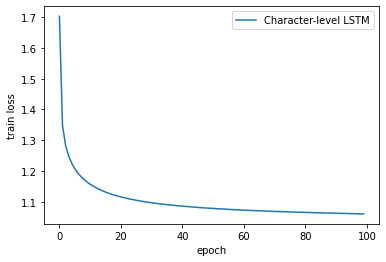

In [ ]:
sns.lineplot(x='epoch', y='train loss', data=LSTM_result2, label='Character-level LSTM')

The training loss seems to converge after 60 epochs. Let's generate some text

In [ ]:
PATH4 ='/content/drive/Shareddrives/DATA 690 Project/Checkpoints/LSTM_model_5stars2.pt'
checkpoint4 = torch.load(PATH4)
pretrain_LSTM_model2 = LSTM(len(LSTM_Data2.word2indx), 32, 128, layers=2)
pretrain_LSTM_model2 = pretrain_LSTM_model2.to(device)
pretrain_LSTM_model2.load_state_dict(checkpoint4['model_state_dict'])
epoch = checkpoint4['epoch']

pretrain_LSTM_model2.eval()

LSTM(
  (embd): Embedding(32, 32)
  (lstm): LSTM(32, 128, num_layers=2, batch_first=True)
  (pred_class): Sequential(
    (0): Linear(in_features=128, out_features=128, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    (3): Linear(in_features=128, out_features=32, bias=True)
  )
)

In [ ]:
#Set up our seed and the location to store the generated content
sampling = []

seed = "The restaurant".lower()
for item in seed:
  sampling.append(item)

#pick a temperature
temperature = 0.75
with torch.no_grad():
    #initialize the hidden state to avoid redundant work
    state = pretrain_LSTM_model2.initHiddenStates(1)
    
    input = torch.tensor([LSTM_Data2.word2indx[x] for x in seed]).unsqueeze(1) 
    input = input[len(seed)-1].unsqueeze(1)
    input = input.to(device)
    for i in range(500):
        output, _ = pretrain_LSTM_model2(input, state)
        h = F.softmax(output/temperature, dim=1) #make probabilities
        next_tokens = torch.multinomial(h, 1).item()

        input.fill_(next_tokens)

        word = LSTM_Data2.indx2word[next_tokens]
        sampling.append(word)

            
print("".join(sampling))

the restauranthairerane tha ab b a iati, t thy is whe t fat bandoucerex and mo landeamat mothatiti thawin fond gan wothand ly aont s acotoupos es wa congare b s ande.
werex feeland, pinotic gref at n ithed hongs whamalonds. wathonsecane ouby tre m a wo, nu anes wand chas corouranturid vandous, og, boure ids. oa s e an s akis s. fangis iz is ind at me chas thoubly ane and pes amoum coothng burathe iveres mecras ftis iangupa a toethe aangooreren owanuburithw by ined tabes thas s s tiaw y ooman oung t totis ale.


By using temperature 0.75. this model can't generate any meaningful sentences.
Looks like all three character-level models are not performing very well, and now we will try to implement a word-level model to see if any better.

###Word-level Generative Model: LSTM Model

For the word-level model, we are still using the same LSTM model in above, but we need to use different approach for vocab tokenization. Below is the updated LSTM_Dataset for word-level model.

In [ ]:
class LSTM_Dataset(Dataset):
    def __init__(self, large_string, MAX_CHUNK=500):
        # we are going to use the tokenizer from pytorch library
        #we will be fine with the default english style tokenizer
        tokenizer = get_tokenizer('basic_english') 
        self.text = large_string
        self.words = tokenizer(self.text)
        self.MAX_CHUNK = MAX_CHUNK

        #count the number of unique tokens we see and how often we see them
        counter = Counter() 
        counter.update(self.words)

        word2indx = {}
        indx2word = {}
        for index, word in enumerate(counter):
            word2indx[word] = index
            indx2word[index] = word

        self.word2indx = word2indx
        self.indx2word = indx2word
        self.words2indexes = [self.word2indx[w] for w in self.words]

    def __len__(self):
        return (len(self.words2indexes)-1) // self.MAX_CHUNK

    def __getitem__(self, idx):
        #Compute the starting position for the idx'th chunk
        start = idx*self.MAX_CHUNK
        #Grab the input sub-string
        sub_string = self.words2indexes[start:start+self.MAX_CHUNK]
        #convert the sub-string into integers based on our vocab
        x = sub_string
        
        #grab the label sub-string by shifting over by 1
        sub_string = self.words2indexes[start+1:start+self.MAX_CHUNK+1]
        #convert the label sub-string into integers based on our vocab
        y = sub_string

        return torch.tensor(x, dtype=torch.int64), torch.tensor(y, dtype=torch.int64)

In [ ]:
five_stars_text = open('/content/drive/Shareddrives/DATA 690 Project/dataset/Transformed/5StarsReview.txt').read()
# remove non-english characters
encoded_string = five_stars_text.encode("ascii", "ignore")
five_stars_text = encoded_string.decode()


In [ ]:
LSTM_Data = LSTM_Dataset(five_stars_text, MAX_CHUNK=50)
LSTM_loader = DataLoader(LSTM_Data, batch_size=128, shuffle=True, drop_last=True)

LSTM_model = LSTM(len(LSTM_Data.word2indx), 32, 128, layers=2)
LSTM_model = LSTM_model.to(device)

for p in LSTM_model.parameters():
    p.register_hook(lambda grad: torch.clamp(grad, -2, 2))

In [ ]:
loss_func = nn.CrossEntropyLoss()

In [ ]:
checkpoint_file='/content/drive/Shareddrives/DATA 690 Project/Checkpoints/LSTM_model_5stars.pt'
LSTM_result = LSTM_train_network(LSTM_model, loss_func, LSTM_loader, epochs=200, device=device, checkpoint_file=checkpoint_file)

Epoch:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

Training:   0%|          | 0/616 [00:00<?, ?it/s]

In [ ]:
LSTM_result

,epoch,total time,train loss
0,0,58.579361,5.453997
1,1,117.206512,4.712015
2,2,175.762757,4.506470
3,3,234.300035,4.377020
4,4,292.998324,4.282638
...,...,...,...
195,195,11471.361276,3.380301
196,196,11529.937271,3.379855
197,197,11588.394703,3.379528
198,198,11646.922776,3.378908


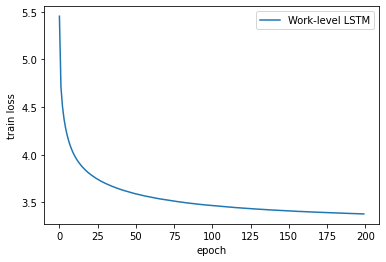

In [ ]:
sns.lineplot(x='epoch', y='train loss', data=LSTM_result, label='Work-level LSTM')

The model seems to converge after 150 epochs. Let's generate some sentences.

In [ ]:
PATH3 ='/content/drive/Shareddrives/DATA 690 Project/Checkpoints/LSTM_model_5stars.pt'
checkpoint3 = torch.load(PATH3)
pretrain_LSTM_model = LSTM(len(LSTM_Data.word2indx), 32, 128, layers=2)
pretrain_LSTM_model = pretrain_LSTM_model.to(device)
pretrain_LSTM_model.load_state_dict(checkpoint3['model_state_dict'])
epoch = checkpoint3['epoch']

pretrain_LSTM_model.eval()

LSTM(
  (embd): Embedding(52993, 32)
  (lstm): LSTM(32, 128, num_layers=2, batch_first=True)
  (pred_class): Sequential(
    (0): Linear(in_features=128, out_features=128, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    (3): Linear(in_features=128, out_features=52993, bias=True)
  )
)

In [ ]:
#Set up our seed and the location to store the generated content
sampling = []

seed = "The restaurant".lower().split(' ')
for item in seed:
  sampling.append(item)

#pick a temperature
temperature = 0.65
with torch.no_grad():
    #initialize the hidden state to avoid redundant work
    state = pretrain_LSTM_model.initHiddenStates(1)
    
    input = torch.tensor([LSTM_Data.word2indx[x] for x in seed]).unsqueeze(1) 
    input = input[len(seed)-1].unsqueeze(1)
    input = input.to(device)
    for i in range(250):
        output, _ = pretrain_LSTM_model(input, state)
        h = F.softmax(output/temperature, dim=1) #make probabilities
        next_tokens = torch.multinomial(h, 1).item()

        input.fill_(next_tokens)

        word = LSTM_Data.indx2word[next_tokens]
        sampling.append(word)

            
print(" ".join(sampling))

the restaurant in fact that i would be back . i like a five stars . in my husband and i ' m addicted . i highly recommend ! ! ! ! ! try the sausage . if you ' m a must be prepared to the manager is . try . very good food . i ' s . the serving the cookies . my mom and the best place was outstanding place was a bit of the next time . i will be sure you ' s was a few hours , but it ' t ) . the best of course . . i ' s . . . . the best ! my first time . this place . i ' s a little food and my husband . the staff . i ' s the place . if you would be sure . i ' s , so i was perfect . . the best dessert . i was the place . had a place and the food at the food and i have a restaurant - the only . what i ' s worth the pizza ! ! ! if i had the sandwich in the best friend . the only so i didn ' t believe it ' s was great staff are my husband . i ' ve had the gyro . my favorite place to try the sauce and i ' s definitely worth the right ? ) great food . i had


With temperature 0.65, the generated text seems to be meaningful. It is mainly because this is a word-level model, so all vacab are English words. However, some simple generated sentences are readable and free of grammatical error, so the word-level LSTM model performs the best among all generative models.

## Hugging Face Models



<p>The Hugging Face transformers package is an immensely popular Python library providing pretrained models that are extraordinarily useful for a variety of natural language processing (NLP) tasks.</p>

<p>In this section, we will utilize the transformers in this library to do text classification and generation for our Yelp dataset.</p>

<br>

References:

https://huggingface.co/docs/transformers/notebooks

https://huggingface.co/docs/transformers/model_doc/gpt2

https://medium.com/swlh/fine-tuning-gpt-2-for-magic-the-gathering-flavour-text-generation-3bafd0f9bb93

In [ ]:
# first of all, install the huggingface library
! pip install transformers datasets

     |████████████████████████████████| 3.1 MB 4.0 MB/s 
     |████████████████████████████████| 298 kB 74.6 MB/s 
     |████████████████████████████████| 596 kB 65.2 MB/s 
     |████████████████████████████████| 3.3 MB 56.3 MB/s 
     |████████████████████████████████| 895 kB 79.1 MB/s 
     |████████████████████████████████| 61 kB 683 kB/s 
     |████████████████████████████████| 1.1 MB 72.2 MB/s 
     |████████████████████████████████| 243 kB 91.0 MB/s 
     |████████████████████████████████| 132 kB 88.3 MB/s 
     |████████████████████████████████| 192 kB 90.4 MB/s 
     |████████████████████████████████| 271 kB 65.7 MB/s 
     |████████████████████████████████| 160 kB 64.8 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
!git clone https://github.com/EdwardRaff/Inside-Deep-Learning.git
%run /content/Inside-Deep-Learning/idlmam.py

Cloning into 'Inside-Deep-Learning'...
remote: Enumerating objects: 34, done.
remote: Counting objects: 100% (34/34), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 34 (delta 10), reused 28 (delta 7), pack-reused 0
Unpacking objects: 100% (34/34), done.


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from collections import Counter
from transformers import AutoTokenizer
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import AutoModelForSequenceClassification, TrainingArguments, Trainer
from transformers import GPT2LMHeadModel, TrainingArguments, Trainer
import nltk
from nltk.corpus import stopwords
from nltk.stem import *
from nltk.stem.porter import *
from datasets import load_metric
from transformers import GPT2Tokenizer
from transformers import TextDataset, DataCollatorForLanguageModeling

In [ ]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Classification Models

In [ ]:
review_url = '/content/drive/Shareddrives/DATA 690 Project/dataset/Transformed/yelp_restaurant_review.csv'
review_df = pd.read_csv(review_url)

In [ ]:
def lowercase(text):
    return text.lower()
    

In [ ]:
review_df['text'] = review_df['text'].apply(lowercase)

In [ ]:
texts, label = review_df.iloc[:, 2].values.tolist(), review_df.iloc[:, 1].values.tolist()

Encounter CUDA runtime error : device-side assert triggered during training

fix by reordering label start index to start at 0

Reference:
https://stackoverflow.com/a/55272357


In [ ]:
# Encounter CUDA runtime error : device-side assert triggered during training
# fix by reordering label start index to start at 0
# Reference:
# https://stackoverflow.com/a/55272357

label = [x - 1 for x in label]

In [ ]:
# split the data set into training and testing data with 20% ratio
train_texts, test_texts, train_labels, test_labels = train_test_split(texts, label, test_size=0.2, stratify=label, random_state=0)

In [ ]:
# split the train data set into training and validating data with 15% ratio
train_texts, val_texts, train_labels, val_labels = train_test_split(train_texts, train_labels, test_size=0.15, stratify=train_labels, random_state=0)

For this project, we are going to fine tune DistilBERT model.

DistilBERT is a small, fast, cheap and light Transformer model trained by distilling BERT base. It has 40% less parameters than bert-base-uncased, runs 60% faster while preserving over 95% of BERT’s performances.

The original BERT model is also practical but requires more computing power and training time, so we are going to take the advantage of DistilBERT and see the performance of the transformer from huggingface.




Load the DistilBERT uncased tokenizer

In [ ]:
tokenizer = AutoTokenizer.from_pretrained("distilbert-base-uncased")

https://huggingface.co/distilbert-base-uncased/resolve/main/tokenizer_config.json not found in cache or force_download set to True, downloading to /root/.cache/huggingface/transformers/tmpyaan9ft8


Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

storing https://huggingface.co/distilbert-base-uncased/resolve/main/tokenizer_config.json in cache at /root/.cache/huggingface/transformers/8c8624b8ac8aa99c60c912161f8332de003484428c47906d7ff7eb7f73eecdbb.20430bd8e10ef77a7d2977accefe796051e01bc2fc4aa146bc862997a1a15e79
creating metadata file for /root/.cache/huggingface/transformers/8c8624b8ac8aa99c60c912161f8332de003484428c47906d7ff7eb7f73eecdbb.20430bd8e10ef77a7d2977accefe796051e01bc2fc4aa146bc862997a1a15e79
https://huggingface.co/distilbert-base-uncased/resolve/main/config.json not found in cache or force_download set to True, downloading to /root/.cache/huggingface/transformers/tmp5fs1fdzl


Downloading:   0%|          | 0.00/483 [00:00<?, ?B/s]

storing https://huggingface.co/distilbert-base-uncased/resolve/main/config.json in cache at /root/.cache/huggingface/transformers/23454919702d26495337f3da04d1655c7ee010d5ec9d77bdb9e399e00302c0a1.91b885ab15d631bf9cee9dc9d25ece0afd932f2f5130eba28f2055b2220c0333
creating metadata file for /root/.cache/huggingface/transformers/23454919702d26495337f3da04d1655c7ee010d5ec9d77bdb9e399e00302c0a1.91b885ab15d631bf9cee9dc9d25ece0afd932f2f5130eba28f2055b2220c0333
loading configuration file https://huggingface.co/distilbert-base-uncased/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/23454919702d26495337f3da04d1655c7ee010d5ec9d77bdb9e399e00302c0a1.91b885ab15d631bf9cee9dc9d25ece0afd932f2f5130eba28f2055b2220c0333
Model config DistilBertConfig {
  "activation": "gelu",
  "architectures": [
    "DistilBertForMaskedLM"
  ],
  "attention_dropout": 0.1,
  "dim": 768,
  "dropout": 0.1,
  "hidden_dim": 3072,
  "initializer_range": 0.02,
  "max_position_embeddings": 512,
  "model_

Downloading:   0%|          | 0.00/226k [00:00<?, ?B/s]

storing https://huggingface.co/distilbert-base-uncased/resolve/main/vocab.txt in cache at /root/.cache/huggingface/transformers/0e1bbfda7f63a99bb52e3915dcf10c3c92122b827d92eb2d34ce94ee79ba486c.d789d64ebfe299b0e416afc4a169632f903f693095b4629a7ea271d5a0cf2c99
creating metadata file for /root/.cache/huggingface/transformers/0e1bbfda7f63a99bb52e3915dcf10c3c92122b827d92eb2d34ce94ee79ba486c.d789d64ebfe299b0e416afc4a169632f903f693095b4629a7ea271d5a0cf2c99
https://huggingface.co/distilbert-base-uncased/resolve/main/tokenizer.json not found in cache or force_download set to True, downloading to /root/.cache/huggingface/transformers/tmp5r_7i9c7


Downloading:   0%|          | 0.00/455k [00:00<?, ?B/s]

storing https://huggingface.co/distilbert-base-uncased/resolve/main/tokenizer.json in cache at /root/.cache/huggingface/transformers/75abb59d7a06f4f640158a9bfcde005264e59e8d566781ab1415b139d2e4c603.7f2721073f19841be16f41b0a70b600ca6b880c8f3df6f3535cbc704371bdfa4
creating metadata file for /root/.cache/huggingface/transformers/75abb59d7a06f4f640158a9bfcde005264e59e8d566781ab1415b139d2e4c603.7f2721073f19841be16f41b0a70b600ca6b880c8f3df6f3535cbc704371bdfa4
loading file https://huggingface.co/distilbert-base-uncased/resolve/main/vocab.txt from cache at /root/.cache/huggingface/transformers/0e1bbfda7f63a99bb52e3915dcf10c3c92122b827d92eb2d34ce94ee79ba486c.d789d64ebfe299b0e416afc4a169632f903f693095b4629a7ea271d5a0cf2c99
loading file https://huggingface.co/distilbert-base-uncased/resolve/main/tokenizer.json from cache at /root/.cache/huggingface/transformers/75abb59d7a06f4f640158a9bfcde005264e59e8d566781ab1415b139d2e4c603.7f2721073f19841be16f41b0a70b600ca6b880c8f3df6f3535cbc704371bdfa4
loading

Encode our three datasets, enable truncation, padding and define maximum length, so all records will have the same input length.

In [ ]:
# hugging face tokenizer takes care of sequence padding and truncation, and we can also pass the max sequence length as an argument
train_encodings = tokenizer(train_texts, truncation=True, padding=True, max_length=500)

In [ ]:
val_encodings = tokenizer(val_texts, truncation=True, padding=True, max_length=500)

In [ ]:
test_encodings = tokenizer(test_texts, truncation=True, padding=True, max_length=500)

In [ ]:
class YelpReviewDataset(Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

In [ ]:
train_dataset = YelpReviewDataset(train_encodings, train_labels)
val_dataset = YelpReviewDataset(val_encodings, val_labels)
test_dataset = YelpReviewDataset(test_encodings, test_labels)

In [ ]:
# show an example of train dataset
train_dataset.__getitem__(0)

{'attention_mask': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0

Load and fine tune the distilbert model

In [ ]:
# load the pertained model and specify the numbers of labels to fit our dataset
model = AutoModelForSequenceClassification.from_pretrained("distilbert-base-uncased", problem_type = 'single_label_classification', num_labels = 5)
model.parameters

Downloading:   0%|          | 0.00/256M [00:00<?, ?B/s]

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_transform.bias', 'vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_projector.weight', 'vocab_transform.weight', 'vocab_layer_norm.bias']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier

<bound method Module.parameters of DistilBertForSequenceClassification(
  (distilbert): DistilBertModel(
    (embeddings): Embeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (transformer): Transformer(
      (layer): ModuleList(
        (0): TransformerBlock(
          (attention): MultiHeadSelfAttention(
            (dropout): Dropout(p=0.1, inplace=False)
            (q_lin): Linear(in_features=768, out_features=768, bias=True)
            (k_lin): Linear(in_features=768, out_features=768, bias=True)
            (v_lin): Linear(in_features=768, out_features=768, bias=True)
            (out_lin): Linear(in_features=768, out_features=768, bias=True)
          )
          (sa_layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
          (ffn): FFN(
            (dropout): Dr

For training, we use the hugging face training API and save the model checkpoint and tensorboard files for analysis

In [ ]:
# define training arguments for trainer API
training_args = TrainingArguments(
    output_dir='/content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification',          # output directory
    evaluation_strategy = 'epoch',
    num_train_epochs=5,              # total number of training epochs
    per_device_train_batch_size=16,  # batch size per device during training
    per_device_eval_batch_size=64,   # batch size for evaluation
    logging_dir='/content/drive/Shareddrives/DATA 690 Project/huggingface/logs/classification',            # directory for storing logs
    logging_steps=10,
)

In [ ]:
metric = load_metric("accuracy")

# define the compute_metrics function that just convert logits to predictions
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    return metric.compute(predictions=predictions, references=labels)

# create a new Trainer with our fine-tuned model
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics,
)


Downloading:   0%|          | 0.00/1.42k [00:00<?, ?B/s]

In [ ]:
trainer.train()

***** Running training *****
  Num examples = 136000
  Num Epochs = 5
  Instantaneous batch size per device = 16
  Total train batch size (w. parallel, distributed & accumulation) = 16
  Gradient Accumulation steps = 1
  Total optimization steps = 42500


Epoch,Training Loss,Validation Loss,Accuracy
1,0.792000,0.766532,0.664042
2,0.685500,0.765121,0.673458


Saving model checkpoint to /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/checkpoint-500
Configuration saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/checkpoint-500/config.json
Model weights saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/checkpoint-500/pytorch_model.bin
Saving model checkpoint to /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/checkpoint-1000
Configuration saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/checkpoint-1000/config.json
Model weights saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/checkpoint-1000/pytorch_model.bin
Saving model checkpoint to /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/checkpoint-1500
Configuration saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/che

Epoch,Training Loss,Validation Loss,Accuracy
1,0.792000,0.766532,0.664042
2,0.685500,0.765121,0.673458
3,0.657900,0.850624,0.666875
4,0.411600,0.999041,0.662292
5,0.281300,1.283395,0.656583


Saving model checkpoint to /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/checkpoint-20000
Configuration saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/checkpoint-20000/config.json
Model weights saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/checkpoint-20000/pytorch_model.bin
Saving model checkpoint to /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/checkpoint-20500
Configuration saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/checkpoint-20500/config.json
Model weights saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/checkpoint-20500/pytorch_model.bin
Saving model checkpoint to /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/checkpoint-21000
Configuration saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classifi

TrainOutput(global_step=42500, training_loss=0.5544927004533655, metrics={'train_runtime': 19841.0463, 'train_samples_per_second': 34.272, 'train_steps_per_second': 2.142, 'total_flos': 8.79713382e+16, 'train_loss': 0.5544927004533655, 'epoch': 5.0})

The training loss seems to decrease, but the validation loss increase over 5 epochs. In terms of accuracy, after 5 epochs of training, we have 65% accuracy.

Evaluate the model

Load our trained model from the checkpoint file, so we don't need to wait hours to see the result.

In [ ]:
pretrained_model = AutoModelForSequenceClassification.from_pretrained('/content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/checkpoint-42500').to(device)


loading configuration file /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/checkpoint-42500/config.json
Model config DistilBertConfig {
  "_name_or_path": "distilbert-base-uncased",
  "activation": "gelu",
  "architectures": [
    "DistilBertForSequenceClassification"
  ],
  "attention_dropout": 0.1,
  "dim": 768,
  "dropout": 0.1,
  "hidden_dim": 3072,
  "id2label": {
    "0": "LABEL_0",
    "1": "LABEL_1",
    "2": "LABEL_2",
    "3": "LABEL_3",
    "4": "LABEL_4"
  },
  "initializer_range": 0.02,
  "label2id": {
    "LABEL_0": 0,
    "LABEL_1": 1,
    "LABEL_2": 2,
    "LABEL_3": 3,
    "LABEL_4": 4
  },
  "max_position_embeddings": 512,
  "model_type": "distilbert",
  "n_heads": 12,
  "n_layers": 6,
  "pad_token_id": 0,
  "problem_type": "single_label_classification",
  "qa_dropout": 0.1,
  "seq_classif_dropout": 0.2,
  "sinusoidal_pos_embds": false,
  "tie_weights_": true,
  "torch_dtype": "float32",
  "transformers_version": "4.12.5",
  "vocab_size"

In [ ]:
pretrained_trainer = Trainer(
    model=pretrained_model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics,
)

In [ ]:
pretrained_trainer.evaluate()

***** Running Evaluation *****
  Num examples = 24000
  Batch size = 64


{'eval_accuracy': 0.6565833333333333,
 'eval_loss': 1.2833945751190186,
 'eval_runtime': 210.4873,
 'eval_samples_per_second': 114.021,
 'eval_steps_per_second': 1.782}

In [ ]:
pretrained_trainer.evaluate(test_dataset)

***** Running Evaluation *****
  Num examples = 40000
  Batch size = 64


{'eval_accuracy': 0.6552,
 'eval_loss': 1.288515329360962,
 'eval_runtime': 350.8772,
 'eval_samples_per_second': 114.0,
 'eval_steps_per_second': 1.781}

In [ ]:
# select 20 test samples for prediction
pred_encodings = tokenizer(test_texts[:30], truncation=True, padding=True, max_length=500)
pred_dataset = YelpReviewDataset(pred_encodings, test_labels[:30])

In [ ]:
result = pretrained_trainer.predict(pred_dataset)

***** Running Prediction *****
  Num examples = 30
  Batch size = 64


In [ ]:
print('Labels:      {}'.format(test_labels[:30]))
print('Predictions: {}'.format([np.argmax(classes) for classes in result.predictions]))

Labels:      [2, 1, 1, 0, 0, 0, 1, 0, 0, 2, 3, 0, 1, 4, 0, 3, 4, 3, 2, 2, 0, 4, 0, 1, 2, 4, 1, 0, 3, 4]
Predictions: [2, 2, 1, 1, 1, 0, 1, 0, 0, 2, 2, 0, 1, 4, 0, 3, 3, 4, 3, 2, 1, 3, 0, 1, 2, 4, 1, 2, 3, 4]


In [ ]:
result.metrics

{'test_accuracy': 0.6666666666666666,
 'test_loss': 1.4325995445251465,
 'test_runtime': 0.203,
 'test_samples_per_second': 147.777,
 'test_steps_per_second': 4.926}

We can see the model has about 65% validation and testing accuracy. Looking at the 20 test samples predictions, the incorrect results are mostly off by 1 label index, which makes sense because negative reviews might end up with 1 or 2 stars and positive reviews might end up with 4 or 5 stars. If we shorten the classes, the model performance could be improved. However, we would like to see the power of pretained model from hugging face and reducing class size will contradict our intention and purpose of this section.

Overall, by fine-tuning the hugging face model, we can get a better result to classify review text.

In [ ]:
# to see tensorboard graphs
%reload_ext tensorboard

%tensorboard --logdir='/content/drive/Shareddrives/DATA 690 Project/huggingface/logs/classification'

<IPython.core.display.Javascript object>

We would like to see if additional training improves model's performance.

Train 2 more epochs in addition to original 5 epochs pretrained model to see if any improvement

In [ ]:
round2_model = AutoModelForSequenceClassification.from_pretrained('/content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/checkpoint-42500').to(device)

loading configuration file /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/checkpoint-42500/config.json
Model config DistilBertConfig {
  "_name_or_path": "distilbert-base-uncased",
  "activation": "gelu",
  "architectures": [
    "DistilBertForSequenceClassification"
  ],
  "attention_dropout": 0.1,
  "dim": 768,
  "dropout": 0.1,
  "hidden_dim": 3072,
  "id2label": {
    "0": "LABEL_0",
    "1": "LABEL_1",
    "2": "LABEL_2",
    "3": "LABEL_3",
    "4": "LABEL_4"
  },
  "initializer_range": 0.02,
  "label2id": {
    "LABEL_0": 0,
    "LABEL_1": 1,
    "LABEL_2": 2,
    "LABEL_3": 3,
    "LABEL_4": 4
  },
  "max_position_embeddings": 512,
  "model_type": "distilbert",
  "n_heads": 12,
  "n_layers": 6,
  "pad_token_id": 0,
  "problem_type": "single_label_classification",
  "qa_dropout": 0.1,
  "seq_classif_dropout": 0.2,
  "sinusoidal_pos_embds": false,
  "tie_weights_": true,
  "torch_dtype": "float32",
  "transformers_version": "4.12.5",
  "vocab_size"

In [ ]:
round2_training_args = TrainingArguments(
    output_dir='/content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification_round2',          # output directory
    evaluation_strategy = 'epoch',
    num_train_epochs=2,              # total number of training epochs
    per_device_train_batch_size=16,  # batch size per device during training
    per_device_eval_batch_size=64,   # batch size for evaluation
    logging_dir='/content/drive/Shareddrives/DATA 690 Project/huggingface/logs/classification_round2',            # directory for storing logs
    logging_steps=10,
)

round2_trainer = Trainer(
    model=round2_model,
    args=round2_training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics,
)


PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


In [ ]:
round2_trainer.train()

***** Running training *****
  Num examples = 136000
  Num Epochs = 2
  Instantaneous batch size per device = 16
  Total train batch size (w. parallel, distributed & accumulation) = 16
  Gradient Accumulation steps = 1
  Total optimization steps = 17000


Epoch,Training Loss,Validation Loss,Accuracy
1,0.466500,1.094277,0.657250
2,0.164800,1.577262,0.656083


Saving model checkpoint to /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification_round2/checkpoint-500
Configuration saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification_round2/checkpoint-500/config.json
Model weights saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification_round2/checkpoint-500/pytorch_model.bin
Saving model checkpoint to /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification_round2/checkpoint-1000
Configuration saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification_round2/checkpoint-1000/config.json
Model weights saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification_round2/checkpoint-1000/pytorch_model.bin
Saving model checkpoint to /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification_round2/checkpoint-1500
Configuration saved in /content/drive/Shareddrives/DATA 

TrainOutput(global_step=17000, training_loss=0.29871400193607106, metrics={'train_runtime': 7967.5436, 'train_samples_per_second': 34.139, 'train_steps_per_second': 2.134, 'total_flos': 3.518853528e+16, 'train_loss': 0.29871400193607106, 'epoch': 2.0})

In [ ]:
path='/content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification_round2/checkpoint-17000'
pretrained_model2 = AutoModelForSequenceClassification.from_pretrained(path).to(device)

loading configuration file /content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification_round2/checkpoint-17000/config.json
Model config DistilBertConfig {
  "_name_or_path": "/content/drive/Shareddrives/DATA 690 Project/huggingface/models/classification/checkpoint-42500",
  "activation": "gelu",
  "architectures": [
    "DistilBertForSequenceClassification"
  ],
  "attention_dropout": 0.1,
  "dim": 768,
  "dropout": 0.1,
  "hidden_dim": 3072,
  "id2label": {
    "0": "LABEL_0",
    "1": "LABEL_1",
    "2": "LABEL_2",
    "3": "LABEL_3",
    "4": "LABEL_4"
  },
  "initializer_range": 0.02,
  "label2id": {
    "LABEL_0": 0,
    "LABEL_1": 1,
    "LABEL_2": 2,
    "LABEL_3": 3,
    "LABEL_4": 4
  },
  "max_position_embeddings": 512,
  "model_type": "distilbert",
  "n_heads": 12,
  "n_layers": 6,
  "pad_token_id": 0,
  "problem_type": "single_label_classification",
  "qa_dropout": 0.1,
  "seq_classif_dropout": 0.2,
  "sinusoidal_pos_embds": false,
  "tie_weights_": true,

In [ ]:
pretrained_trainer2 = Trainer(
    model=pretrained_model2,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics,
)

In [ ]:
pretrained_trainer2.evaluate()

***** Running Evaluation *****
  Num examples = 24000
  Batch size = 64


{'eval_accuracy': 0.6560833333333334,
 'eval_loss': 1.5772624015808105,
 'eval_runtime': 210.353,
 'eval_samples_per_second': 114.094,
 'eval_steps_per_second': 1.783}

In [ ]:
pretrained_trainer2.evaluate(test_dataset)

***** Running Evaluation *****
  Num examples = 40000
  Batch size = 64


{'eval_accuracy': 0.65055,
 'eval_loss': 1.59134042263031,
 'eval_runtime': 350.3902,
 'eval_samples_per_second': 114.158,
 'eval_steps_per_second': 1.784}

The additional 2 epochs don't improve the model performance much. The validation and test accuracy score stick to 65%. However, compared to our LSTM classification model's 58% accuracy in the above section, we can reach better performance by utilizing huggingface transformers.

### Text Generative Models

Generate 5 stars review by fine tuning the hugging face GPT2 language model

GPT-2 is a large transformer-based language model with 1.5 billion parameters, trained on a dataset of 8 million web pages. GPT-2 is trained with a simple objective: predict the next word, given all of the previous words within some text. 

Again, we are interested to generate 5 stars review text.

In [ ]:
review_url = '/content/drive/Shareddrives/DATA 690 Project/dataset/Transformed/yelp_restaurant_review.csv'
review_df = pd.read_csv(review_url)
five_stars_review_df = review_df[review_df['stars'] == 5]

In [ ]:
five_stars_review_df

,business_id,stars,text,date
160000,wITbeprsnf9wt1CYHIf4Dw,5,I had a wonderful time dining at The Capital G...,2019-09-18 01:33:15
160001,LozRYM0ECam2aAKiMWALGg,5,Wonderful service and delicious food. \n\nHad ...,2013-01-29 04:15:46
160002,2fCQ_ghUfVHP2MGPhHVKvg,5,I really enjoy stopping into this little famil...,2019-05-04 12:45:18
160003,-I4bxb04YkCSNCbFWto7Gw,5,Literally stumbled into this place after a fun...,2014-12-22 15:55:34
160004,GXy13s5mO4EkcF8rgGxj-A,5,This adorable deli/bar has the best sandwiches...,2018-12-08 15:32:13
...,...,...,...,...
199995,GSg5v3ZJxmMPrlAXqat8tA,5,My husband and I love French food; it tastes s...,2018-06-26 18:35:35
199996,NBICv9HiNqtRJOgR5-2OeQ,5,Wow! We were treated! We found the Blue Door b...,2018-10-12 16:03:16
199997,KL2aHsx0yf_8_IT1DfVMrA,5,The food is absolutely outstanding. I hope Jus...,2020-07-22 04:34:48
199998,XnQYoHy23BULUooiqHe42Q,5,Such a great experience. Came to Lulu Green wi...,2020-02-08 02:12:41


In [ ]:
# extract text and label from the dataset, although label might not be used for generative model
texts, label = review_df.iloc[:, 2].values.tolist(), review_df.iloc[:, 1].values.tolist()

In [ ]:
# split the data set into training and validation data with 20% ratio
train_texts, val_texts, train_labels, val_labels = train_test_split(texts, label, test_size=0.2, stratify=label, random_state=0)

GPT2Tokenizer support definition of custom tokens, so we can customtize our start of sequence token, end of sequence token, and padding token.

In [ ]:
# load the GPT2 language model tokenizer and define our custom tokens
tokenizer = GPT2Tokenizer.from_pretrained('gpt2', bos_token='<|startoftext|>', eos_token='<|endoftext|>', pad_token='<|pad|>')

Downloading:   0%|          | 0.00/0.99M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/446k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.29M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/665 [00:00<?, ?B/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [ ]:
generative_model = GPT2LMHeadModel.from_pretrained("gpt2").to(device)

# we need to resize the token embeddings for the model because we added our own custom tokens for the tokenizer above.
generative_model.resize_token_embeddings(len(tokenizer))
generative_model.parameters

Downloading:   0%|          | 0.00/523M [00:00<?, ?B/s]

<bound method Module.parameters of GPT2LMHeadModel(
  (transformer): GPT2Model(
    (wte): Embedding(50259, 768)
    (wpe): Embedding(1024, 768)
    (drop): Dropout(p=0.1, inplace=False)
    (h): ModuleList(
      (0): GPT2Block(
        (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (attn): GPT2Attention(
          (c_attn): Conv1D()
          (c_proj): Conv1D()
          (attn_dropout): Dropout(p=0.1, inplace=False)
          (resid_dropout): Dropout(p=0.1, inplace=False)
        )
        (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (mlp): GPT2MLP(
          (c_fc): Conv1D()
          (c_proj): Conv1D()
          (dropout): Dropout(p=0.1, inplace=False)
        )
      )
      (1): GPT2Block(
        (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (attn): GPT2Attention(
          (c_attn): Conv1D()
          (c_proj): Conv1D()
          (attn_dropout): Dropout(p=0.1, inplace=False)
          (resid_dropout): Dropo

Define dataset and data collator 

In [ ]:
class GenerativeDataset(Dataset):

  def __init__(self, txt_list, labels, tokenizer, gpt2_type="gpt2", max_length=500):

    self.tokenizer = tokenizer
    self.input_ids = []
    self.attn_masks = []
    self.labels = []

    for i, txt in enumerate(txt_list):
      # append custom tokens and pass it to the tokenizer
      encodings_dict = tokenizer('<|startoftext|>'+ txt + '<|endoftext|>', truncation=True, max_length=max_length, padding="max_length")

      # store tokenized values and attention masks 
      self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
      self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))
      self.labels.append(torch.tensor(labels[i]))
    
  def __len__(self):
    return len(self.input_ids)

  def __getitem__(self, idx):
    return {'input_ids': self.input_ids[idx],
        'attention_mask': self.attn_masks[idx]}


In [ ]:
train_dataset = GenerativeDataset(train_texts, train_labels, tokenizer, max_length=500)
val_dataset = GenerativeDataset(val_texts, val_labels, tokenizer, max_length=500)



In [ ]:
train_dataset.__getitem__(0)

{'attention_mask': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0

In [ ]:
# load the data collator from the hugging face by passing in our GPT2Tokenizer
data_collator = DataCollatorForLanguageModeling(tokenizer=tokenizer, mlm=False)

Again, we are using the trainer API to train our model. 

Define the training arguments, the GTP2 model takes over 4 hours to train 1 epoch for our dataset, so we train only 2 epochs and see the performance.

In [ ]:
generative_training_args = TrainingArguments(
    output_dir='/content/drive/Shareddrives/DATA 690 Project/huggingface/models/generative',          # output directory
    evaluation_strategy = 'epoch',
    num_train_epochs=2,              # total number of training epochs
    per_device_train_batch_size=8,  # batch size per device during training
    per_device_eval_batch_size=16,   # batch size for evaluation
    logging_dir='/content/drive/Shareddrives/DATA 690 Project/huggingface/logs/generative',            # directory for storing logs
    logging_steps=10,
)

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


In [ ]:
generative_trainer = Trainer(
    model=generative_model,
    args=generative_training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    data_collator=data_collator,
)

In [ ]:
generative_trainer.train()

***** Running training *****
  Num examples = 160000
  Num Epochs = 2
  Instantaneous batch size per device = 8
  Total train batch size (w. parallel, distributed & accumulation) = 8
  Gradient Accumulation steps = 1
  Total optimization steps = 40000


Epoch,Training Loss,Validation Loss
1,3.247100,3.187238


Saving model checkpoint to /content/drive/Shareddrives/DATA 690 Project/huggingface/models/generative/checkpoint-500
Configuration saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/generative/checkpoint-500/config.json
Model weights saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/generative/checkpoint-500/pytorch_model.bin
Saving model checkpoint to /content/drive/Shareddrives/DATA 690 Project/huggingface/models/generative/checkpoint-1000
Configuration saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/generative/checkpoint-1000/config.json
Model weights saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/generative/checkpoint-1000/pytorch_model.bin
Saving model checkpoint to /content/drive/Shareddrives/DATA 690 Project/huggingface/models/generative/checkpoint-1500
Configuration saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/generative/checkpoint-1500/config.json
Model w

Epoch,Training Loss,Validation Loss
1,3.247100,3.187238
2,3.128100,3.150458


Saving model checkpoint to /content/drive/Shareddrives/DATA 690 Project/huggingface/models/generative/checkpoint-22000
Configuration saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/generative/checkpoint-22000/config.json
Model weights saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/generative/checkpoint-22000/pytorch_model.bin
Saving model checkpoint to /content/drive/Shareddrives/DATA 690 Project/huggingface/models/generative/checkpoint-22500
Configuration saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/generative/checkpoint-22500/config.json
Model weights saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/generative/checkpoint-22500/pytorch_model.bin
Saving model checkpoint to /content/drive/Shareddrives/DATA 690 Project/huggingface/models/generative/checkpoint-23000
Configuration saved in /content/drive/Shareddrives/DATA 690 Project/huggingface/models/generative/checkpoint-23000/config.j

TrainOutput(global_step=40000, training_loss=3.260435031080246, metrics={'train_runtime': 29482.0011, 'train_samples_per_second': 10.854, 'train_steps_per_second': 1.357, 'total_flos': 8.165376e+16, 'train_loss': 3.260435031080246, 'epoch': 2.0})

Generate review text

Load our trained model from the checkpoint file, so we don't need to wait hours to see the result.

In [ ]:
pretrained_generative_model = GPT2LMHeadModel.from_pretrained('/content/drive/Shareddrives/DATA 690 Project/huggingface/models/generative/checkpoint-40000').to(device)

# we need to resize the token embeddings for the model because we added our own custom tokens for the tokenizer above.
pretrained_generative_model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
pretrained_generative_model.eval()

# our seed would be the custom startoftext token we defined previously, so the model will randomly pick a true start word for us.
seed = "<|startoftext|>"

# encode the seed and put it into a tensor
seed_tokens = torch.tensor(tokenizer.encode(seed)).unsqueeze(0)
seed_tokens = seed_tokens.to(device)

# generate 5 review texts
sampling = pretrained_generative_model.generate(
        seed_tokens, 
        do_sample=True,   
        top_k=50,  # pick from top 50 highest probability score items, which means 50 words are considered for each step
        max_length = 500,
        top_p=0.95,  # nucleus sampling, where the model considers the results of the tokens with top_p probability mass, so 0.95 means only the tokens comprising the top 95% probability mass are considered.
        num_return_sequences=5 # numbers of output
        )

for i, output in enumerate(sampling):
  print("Output {}:\n {}\n\n".format(i, tokenizer.decode(output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


Output 0:
 Best Thai food in Austin. I've been there a couple times now and I loved the food. So authentic and so delicious! They also have fresh hot chutneys and they give you something so fresh and delicious! I've also heard great things about their curry  soup! You gotta try their khao yai, bok choy, and pad Thai! Everything is great! The staff is super friendly and their Thai tea is strong!!


Output 1:
 I've never had a bad time with the waitress.  We have a large party, and she was attentive throughout our meal.  I ordered a cheeseburger and it was delicious!   She made the cheeseburger really tasty and made great suggestions.  She was so friendly and attentive.  The service is also very friendly and helpful.  

The only thing that needs improvement is the size of the table (and it was very cramped).


Output 2:
 My friends and I are from California, where Chinese people who came from overseas often had bad experiences here, even though they speak English. We came to Kandi for th

The generated review texts look great compared to the results of the generative models we created in the previous section. The GPT2 model is fine-tuned successfully with our Yelp Dataset for generating restaurant reviews only with 2 epochs of training. The output is readable and has minimal grammatical errors.

## Summary

<p>




</p>



<p>



</p>

We explained how to use CNN and RNN in pytorch for the text classification and designed the network to accept Word2Vec pre_trained embeddings as input to the network. We applied different techniques to pre-process our text data, using tokenization, removing stop words, stemming/lemmatization.

In terms of the accuracy, CNN showed 76%, applying three classes to define the labels and RNN showed 58%, using five classes labeling. 

For the text generative models, we tried both character-level and word-level autoregressive models. The performance of character-level models are not performing very well, but the word-level one is able to generate some readable sentences.

By utilizing the transformers and pretrained models from hugging face, we are able to develop a better performance text classification model, which has 65% accuracy for five classes labeling. Besides, the text generative model is performing very well to generate meaningful restaurant review texts.